In [ ]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from PIL import Image

# Define dataset paths
train_images_path = './original dataset/datasets/train/images'
valid_images_path = './original dataset/datasets/valid/images'

# Create DataFrame with paths and labels
def load_dataset(images_path):
    data = []
    for img_file in os.listdir(images_path):
        if img_file.endswith('.jpg') or img_file.endswith('.png'):
            img_path = os.path.join(images_path, img_file)
            label = img_file.split('_')[0]  # Adjust based on filename convention
            data.append({'image_path': img_path, 'label': label})
    return pd.DataFrame(data)

# Load training and validation data
train_df = load_dataset(train_images_path)
valid_df = load_dataset(valid_images_path)

# Combine train and valid for processing, then split back after
df = pd.concat([train_df, valid_df], ignore_index=True)

# Split data into train and valid sets
train_data, valid_data = train_test_split(df, test_size=0.2, random_state=42, stratify=df['label'])

# Show dataset sample
train_data.head()


14202

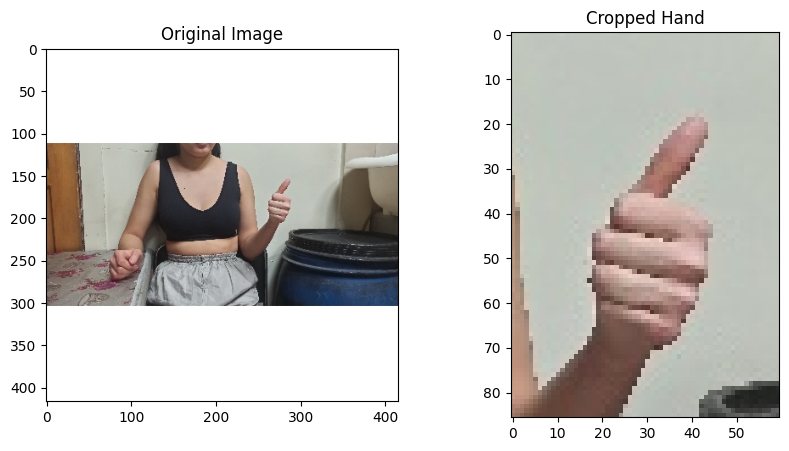

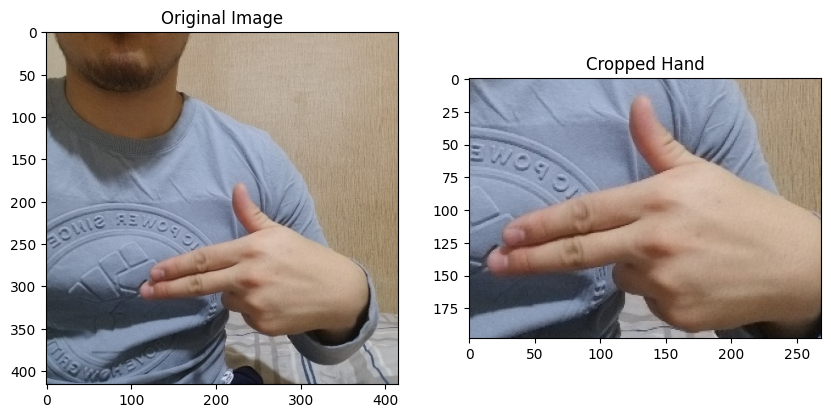

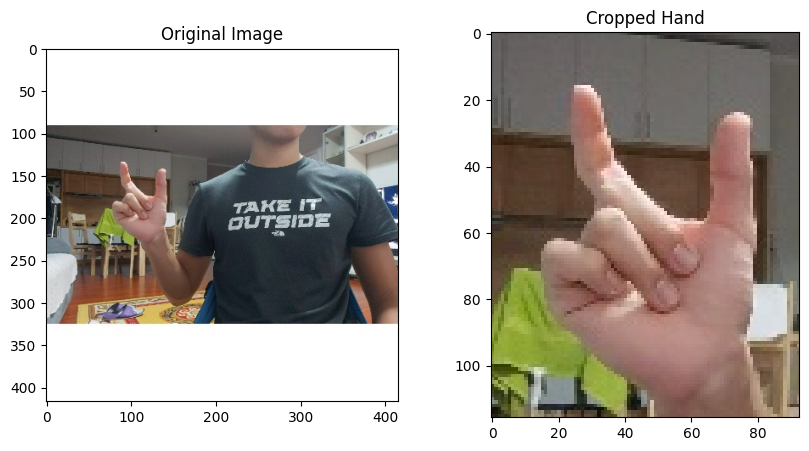

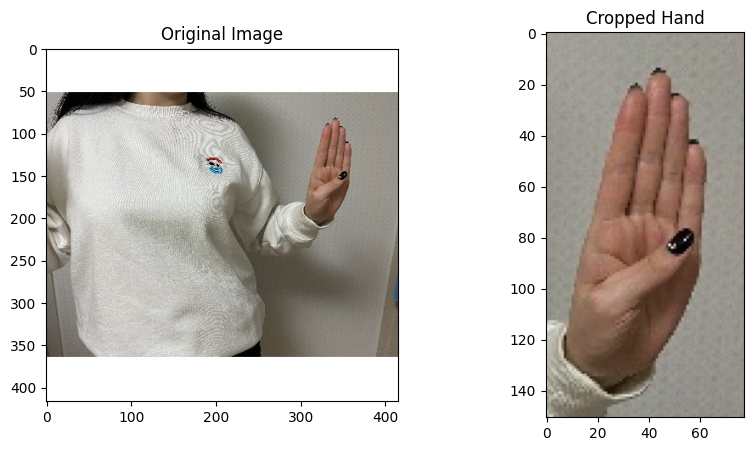

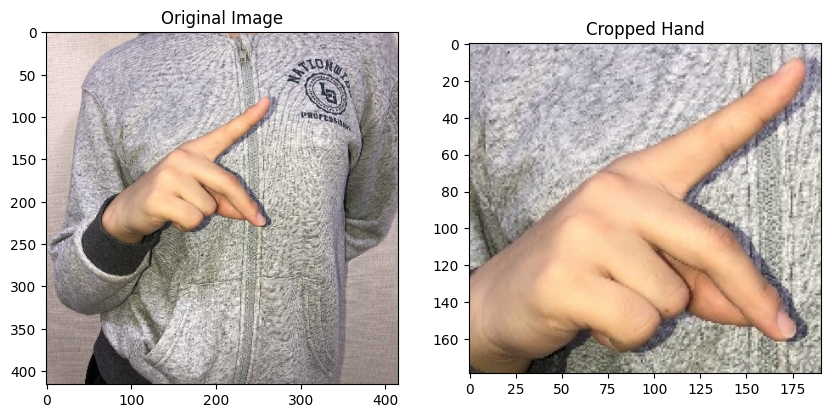

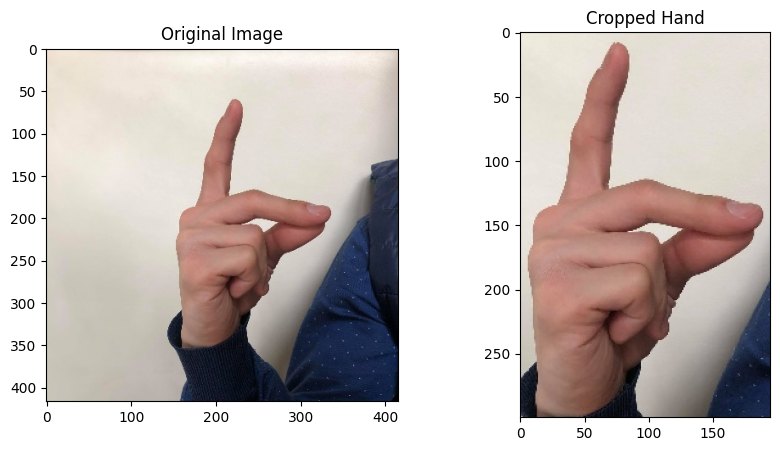

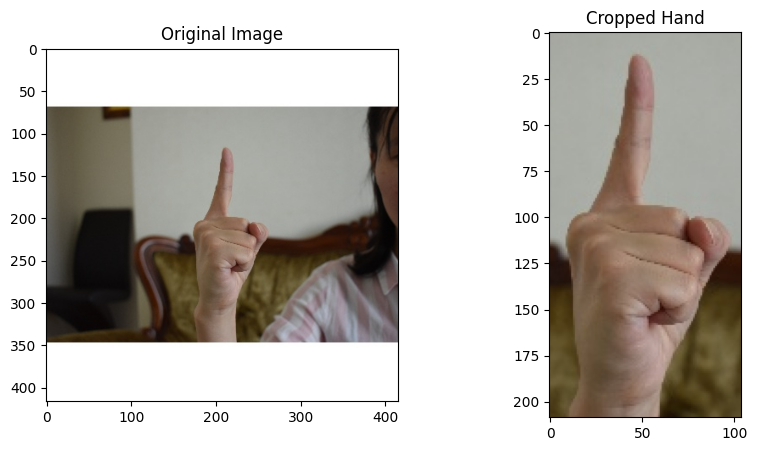

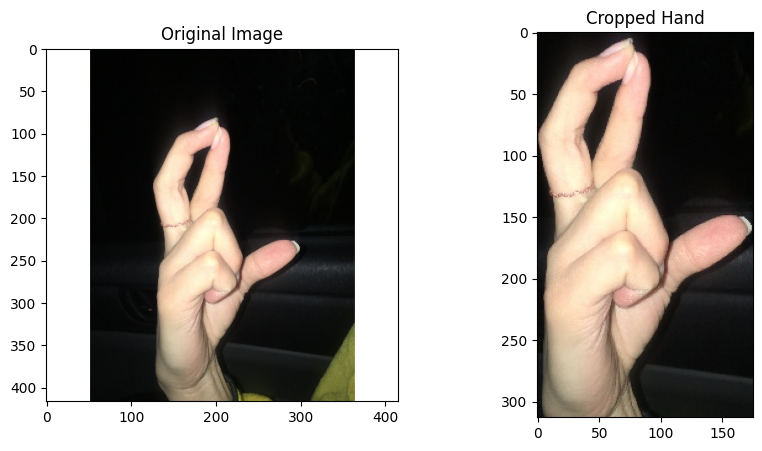

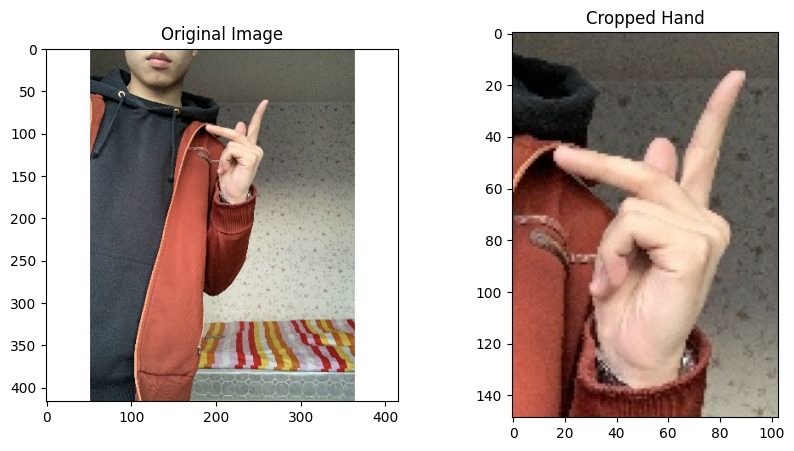

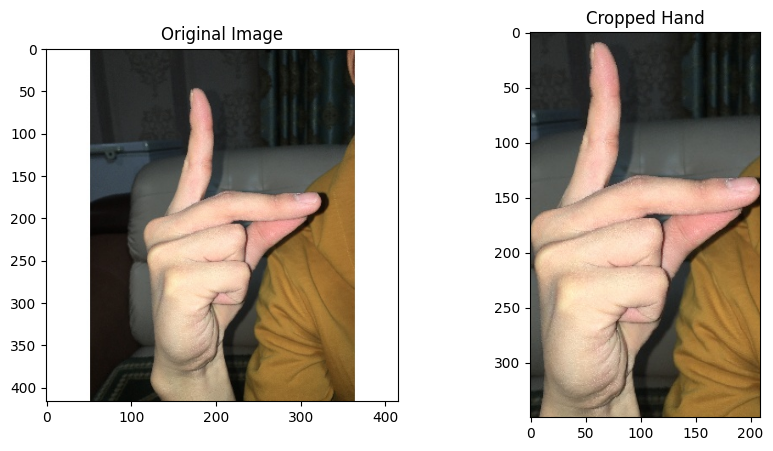

In [22]:
import cv2
import mediapipe as mp
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Initialize MediaPipe Hands
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.7)

def detect_and_crop_hand_mediapipe(image_path, padding=20):
    # Load image and convert to RGB
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Perform hand detection with MediaPipe
    results = hands.process(img_rgb)
    
    if not results.multi_hand_landmarks:
        print("No hand detected in image.")
        return None  # Return None if no hand is detected

    # Get bounding box around hand landmarks
    h, w, _ = img.shape
    hand_landmarks = results.multi_hand_landmarks[0]
    x_min = min([lm.x for lm in hand_landmarks.landmark]) * w
    y_min = min([lm.y for lm in hand_landmarks.landmark]) * h
    x_max = max([lm.x for lm in hand_landmarks.landmark]) * w
    y_max = max([lm.y for lm in hand_landmarks.landmark]) * h

    # Apply padding
    x_min = max(0, int(x_min - padding))
    y_min = max(0, int(y_min - padding))
    x_max = min(w, int(x_max + padding))
    y_max = min(h, int(y_max + padding))

    # Crop the hand region and convert back to RGB for correct color display
    hand_crop = img[y_min:y_max, x_min:x_max]
    hand_crop_rgb = cv2.cvtColor(hand_crop, cv2.COLOR_BGR2RGB)  # Convert to RGB
    hand_crop_pil = Image.fromarray(hand_crop_rgb)

    return hand_crop_pil

# Display example of cropped hands
sample_images = train_data.sample(10)['image_path'].tolist()
for img_path in sample_images:
    cropped_hand = detect_and_crop_hand_mediapipe(img_path, padding=20)
    original_img = Image.open(img_path)
    
    # Show original and cropped image side-by-side
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    
    if cropped_hand:
        plt.subplot(1, 2, 2)
        plt.imshow(cropped_hand)
        plt.title("Cropped Hand")
    else:
        print(f"No hand detected in {img_path}")
    
    plt.show()


In [27]:
import pandas as pd
import tqdm

# Sample 40% of the DataFrame
df_cropped = df.sample(frac=1, random_state=42).reset_index(drop=True)
df_cropped['cropped_image'] = None  # New column for cropped images

# Function to apply cropping to a portion of the DataFrame with a progress tracker
def apply_cropping_with_progress(dataframe, padding=20):
    # Track images with no detected hands
    missing_hands = []
    
    for idx, row in tqdm.tqdm(dataframe.iterrows(), total=len(dataframe), desc="Cropping Progress"):
        img_path = row['image_path']
        cropped_hand = detect_and_crop_hand_mediapipe(img_path, padding=padding)
        
        if cropped_hand:
            dataframe.at[idx, 'cropped_image'] = cropped_hand  # Save cropped hand in the new column
        else:
            missing_hands.append(img_path)  # Log images without a detected hand

    return dataframe, missing_hands

# Apply cropping function to 40% of the DataFrame with a progress bar
df_cropped, missing_hands = apply_cropping_with_progress(df_cropped)

# Debugging Output
print(f"Total images processed: {len(df_cropped)}")
print(f"Images without detected hands: {len(missing_hands)}")
print("List of images with no hand detected:")
for img in missing_hands:
    print(img)


Cropping Progress:   0%|          | 0/14202 [00:00<?, ?it/s]c:\Users\BasantBadr\.conda\envs\python311-env\Lib\site-packages\google\protobuf\symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '
Cropping Progress:   0%|          | 70/14202 [00:01<06:00, 39.21it/s]

No hand detected in image.


Cropping Progress:   1%|          | 89/14202 [00:02<05:36, 41.93it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   1%|          | 104/14202 [00:02<05:18, 44.30it/s]

No hand detected in image.


Cropping Progress:   1%|          | 124/14202 [00:03<05:10, 45.40it/s]

No hand detected in image.


Cropping Progress:   1%|          | 145/14202 [00:03<05:02, 46.41it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   1%|          | 170/14202 [00:04<05:03, 46.30it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   1%|▏         | 180/14202 [00:04<05:08, 45.49it/s]

No hand detected in image.


Cropping Progress:   1%|▏         | 195/14202 [00:04<05:04, 45.93it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   2%|▏         | 215/14202 [00:05<05:07, 45.42it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:   2%|▏         | 241/14202 [00:05<04:56, 47.07it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   2%|▏         | 251/14202 [00:05<05:15, 44.18it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   2%|▏         | 276/14202 [00:06<05:23, 43.08it/s]

No hand detected in image.


Cropping Progress:   2%|▏         | 321/14202 [00:07<05:18, 43.61it/s]

No hand detected in image.


Cropping Progress:   2%|▏         | 336/14202 [00:07<05:46, 39.98it/s]

No hand detected in image.


Cropping Progress:   2%|▏         | 351/14202 [00:08<05:45, 40.12it/s]

No hand detected in image.


Cropping Progress:   3%|▎         | 373/14202 [00:08<05:49, 39.62it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   3%|▎         | 388/14202 [00:09<05:33, 41.44it/s]

No hand detected in image.


Cropping Progress:   3%|▎         | 419/14202 [00:09<05:16, 43.61it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   3%|▎         | 430/14202 [00:10<05:07, 44.73it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   4%|▍         | 554/14202 [00:13<06:42, 33.87it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   4%|▍         | 566/14202 [00:13<06:37, 34.34it/s]

No hand detected in image.


Cropping Progress:   4%|▍         | 599/14202 [00:14<06:26, 35.20it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:   4%|▍         | 639/14202 [00:16<06:45, 33.43it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   5%|▍         | 663/14202 [00:16<06:49, 33.07it/s]

No hand detected in image.


Cropping Progress:   5%|▍         | 679/14202 [00:17<06:49, 33.05it/s]

No hand detected in image.


Cropping Progress:   5%|▍         | 687/14202 [00:17<06:58, 32.30it/s]

No hand detected in image.


Cropping Progress:   5%|▍         | 703/14202 [00:18<07:18, 30.77it/s]

No hand detected in image.


Cropping Progress:   5%|▌         | 715/14202 [00:18<06:48, 33.00it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   5%|▌         | 727/14202 [00:18<06:46, 33.17it/s]

No hand detected in image.


Cropping Progress:   5%|▌         | 748/14202 [00:19<06:52, 32.65it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   5%|▌         | 756/14202 [00:19<06:45, 33.15it/s]

No hand detected in image.


Cropping Progress:   5%|▌         | 776/14202 [00:20<06:38, 33.72it/s]

No hand detected in image.


Cropping Progress:   6%|▌         | 808/14202 [00:21<06:35, 33.86it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   6%|▌         | 817/14202 [00:21<06:24, 34.85it/s]

No hand detected in image.


Cropping Progress:   6%|▌         | 841/14202 [00:22<06:51, 32.47it/s]

No hand detected in image.


Cropping Progress:   6%|▌         | 865/14202 [00:23<06:42, 33.18it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   6%|▋         | 893/14202 [00:23<06:41, 33.16it/s]

No hand detected in image.


Cropping Progress:   7%|▋         | 941/14202 [00:25<06:49, 32.37it/s]

No hand detected in image.


Cropping Progress:   7%|▋         | 949/14202 [00:25<06:47, 32.52it/s]

No hand detected in image.


Cropping Progress:   7%|▋         | 1025/14202 [00:28<06:21, 34.50it/s]

No hand detected in image.


Cropping Progress:   7%|▋         | 1037/14202 [00:28<06:07, 35.79it/s]

No hand detected in image.


Cropping Progress:   7%|▋         | 1053/14202 [00:28<06:03, 36.13it/s]

No hand detected in image.


Cropping Progress:   8%|▊         | 1098/14202 [00:30<05:45, 37.90it/s]

No hand detected in image.


Cropping Progress:   8%|▊         | 1106/14202 [00:30<05:48, 37.54it/s]

No hand detected in image.


Cropping Progress:   8%|▊         | 1114/14202 [00:30<05:53, 37.05it/s]

No hand detected in image.


Cropping Progress:   8%|▊         | 1126/14202 [00:30<06:11, 35.22it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:   8%|▊         | 1142/14202 [00:31<06:03, 35.92it/s]

No hand detected in image.


Cropping Progress:   8%|▊         | 1159/14202 [00:31<05:40, 38.34it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   9%|▊         | 1239/14202 [00:34<06:17, 34.38it/s]

No hand detected in image.


Cropping Progress:   9%|▉         | 1281/14202 [00:35<05:35, 38.47it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:   9%|▉         | 1302/14202 [00:35<05:40, 37.90it/s]

No hand detected in image.


Cropping Progress:   9%|▉         | 1314/14202 [00:36<05:45, 37.28it/s]

No hand detected in image.


Cropping Progress:  10%|▉         | 1359/14202 [00:37<05:34, 38.42it/s]

No hand detected in image.


Cropping Progress:  10%|▉         | 1376/14202 [00:37<05:45, 37.14it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  10%|▉         | 1388/14202 [00:38<05:58, 35.77it/s]

No hand detected in image.


Cropping Progress:  10%|▉         | 1396/14202 [00:38<05:58, 35.75it/s]

No hand detected in image.


Cropping Progress:  10%|▉         | 1417/14202 [00:38<05:44, 37.16it/s]

No hand detected in image.


Cropping Progress:  10%|█         | 1434/14202 [00:39<05:40, 37.46it/s]

No hand detected in image.


Cropping Progress:  10%|█         | 1454/14202 [00:39<05:49, 36.46it/s]

No hand detected in image.


Cropping Progress:  10%|█         | 1463/14202 [00:40<05:47, 36.68it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  10%|█         | 1475/14202 [00:40<05:49, 36.42it/s]

No hand detected in image.


Cropping Progress:  11%|█         | 1500/14202 [00:41<05:30, 38.43it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  11%|█         | 1524/14202 [00:41<05:47, 36.48it/s]

No hand detected in image.


Cropping Progress:  11%|█         | 1544/14202 [00:42<05:46, 36.52it/s]

No hand detected in image.


Cropping Progress:  11%|█         | 1552/14202 [00:42<05:49, 36.19it/s]

No hand detected in image.


Cropping Progress:  11%|█         | 1564/14202 [00:42<05:57, 35.30it/s]

No hand detected in image.


Cropping Progress:  11%|█         | 1576/14202 [00:43<06:11, 33.94it/s]

No hand detected in image.


Cropping Progress:  11%|█▏        | 1600/14202 [00:44<06:12, 33.81it/s]

No hand detected in image.


Cropping Progress:  11%|█▏        | 1608/14202 [00:44<06:02, 34.76it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  12%|█▏        | 1648/14202 [00:45<05:47, 36.10it/s]

No hand detected in image.


Cropping Progress:  12%|█▏        | 1668/14202 [00:45<05:48, 35.95it/s]

No hand detected in image.


Cropping Progress:  12%|█▏        | 1689/14202 [00:46<05:59, 34.80it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  12%|█▏        | 1717/14202 [00:47<05:41, 36.54it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  12%|█▏        | 1733/14202 [00:47<05:40, 36.60it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  12%|█▏        | 1749/14202 [00:48<05:59, 34.62it/s]

No hand detected in image.


Cropping Progress:  12%|█▏        | 1769/14202 [00:48<06:23, 32.40it/s]

No hand detected in image.


Cropping Progress:  13%|█▎        | 1789/14202 [00:49<06:24, 32.31it/s]

No hand detected in image.


Cropping Progress:  13%|█▎        | 1801/14202 [00:49<06:27, 32.01it/s]

No hand detected in image.


Cropping Progress:  13%|█▎        | 1809/14202 [00:50<06:15, 32.99it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  13%|█▎        | 1821/14202 [00:50<06:22, 32.35it/s]

No hand detected in image.


Cropping Progress:  13%|█▎        | 1844/14202 [00:51<06:29, 31.75it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  13%|█▎        | 1888/14202 [00:52<06:07, 33.53it/s]

No hand detected in image.


Cropping Progress:  13%|█▎        | 1904/14202 [00:53<06:13, 32.94it/s]

No hand detected in image.


Cropping Progress:  13%|█▎        | 1912/14202 [00:53<06:09, 33.27it/s]

No hand detected in image.


Cropping Progress:  14%|█▎        | 1944/14202 [00:54<05:42, 35.76it/s]

No hand detected in image.


Cropping Progress:  14%|█▍        | 1970/14202 [00:54<05:13, 38.99it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  14%|█▍        | 1982/14202 [00:55<05:25, 37.57it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  14%|█▍        | 1994/14202 [00:55<05:45, 35.33it/s]

No hand detected in image.


Cropping Progress:  14%|█▍        | 2010/14202 [00:56<06:11, 32.79it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  14%|█▍        | 2039/14202 [00:56<05:40, 35.73it/s]

No hand detected in image.


Cropping Progress:  14%|█▍        | 2056/14202 [00:57<05:23, 37.57it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  15%|█▍        | 2105/14202 [00:58<05:43, 35.18it/s]

No hand detected in image.


Cropping Progress:  15%|█▍        | 2125/14202 [00:59<06:08, 32.76it/s]

No hand detected in image.


Cropping Progress:  15%|█▌        | 2176/14202 [01:01<06:50, 29.28it/s]

No hand detected in image.


Cropping Progress:  15%|█▌        | 2189/14202 [01:01<05:42, 35.07it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  16%|█▌        | 2202/14202 [01:01<05:23, 37.06it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  16%|█▌        | 2215/14202 [01:02<05:12, 38.31it/s]

No hand detected in image.


Cropping Progress:  16%|█▌        | 2228/14202 [01:02<05:08, 38.81it/s]

No hand detected in image.


Cropping Progress:  16%|█▌        | 2237/14202 [01:02<05:09, 38.71it/s]

No hand detected in image.


Cropping Progress:  16%|█▌        | 2274/14202 [01:03<05:05, 39.05it/s]

No hand detected in image.


Cropping Progress:  16%|█▌        | 2291/14202 [01:04<05:05, 38.98it/s]

No hand detected in image.


Cropping Progress:  16%|█▋        | 2333/14202 [01:05<04:59, 39.64it/s]

No hand detected in image.


Cropping Progress:  16%|█▋        | 2342/14202 [01:05<05:09, 38.33it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  17%|█▋        | 2399/14202 [01:07<05:00, 39.28it/s]

No hand detected in image.


Cropping Progress:  17%|█▋        | 2420/14202 [01:07<05:15, 37.31it/s]

No hand detected in image.


Cropping Progress:  17%|█▋        | 2444/14202 [01:08<05:23, 36.34it/s]

No hand detected in image.


Cropping Progress:  17%|█▋        | 2461/14202 [01:08<05:16, 37.12it/s]

No hand detected in image.


Cropping Progress:  18%|█▊        | 2494/14202 [01:09<05:18, 36.80it/s]

No hand detected in image.


Cropping Progress:  18%|█▊        | 2515/14202 [01:10<05:06, 38.18it/s]

No hand detected in image.


Cropping Progress:  18%|█▊        | 2527/14202 [01:10<05:32, 35.09it/s]

No hand detected in image.


Cropping Progress:  18%|█▊        | 2563/14202 [01:11<05:34, 34.82it/s]

No hand detected in image.


Cropping Progress:  18%|█▊        | 2575/14202 [01:11<05:36, 34.53it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  18%|█▊        | 2605/14202 [01:12<04:55, 39.22it/s]

No hand detected in image.


Cropping Progress:  18%|█▊        | 2623/14202 [01:13<04:47, 40.26it/s]

No hand detected in image.


Cropping Progress:  19%|█▊        | 2642/14202 [01:13<04:52, 39.56it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  19%|█▊        | 2660/14202 [01:14<04:50, 39.74it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  19%|█▉        | 2693/14202 [01:14<04:55, 39.01it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  19%|█▉        | 2711/14202 [01:15<05:08, 37.27it/s]

No hand detected in image.


Cropping Progress:  19%|█▉        | 2724/14202 [01:15<05:02, 38.00it/s]

No hand detected in image.


Cropping Progress:  19%|█▉        | 2737/14202 [01:16<04:58, 38.41it/s]

No hand detected in image.


Cropping Progress:  19%|█▉        | 2759/14202 [01:16<04:45, 40.08it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  19%|█▉        | 2768/14202 [01:16<04:43, 40.34it/s]

No hand detected in image.


Cropping Progress:  20%|█▉        | 2778/14202 [01:17<04:44, 40.19it/s]

No hand detected in image.


Cropping Progress:  20%|█▉        | 2788/14202 [01:17<04:40, 40.69it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  20%|█▉        | 2810/14202 [01:17<04:56, 38.45it/s]

No hand detected in image.


Cropping Progress:  20%|█▉        | 2818/14202 [01:18<04:58, 38.09it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  20%|█▉        | 2835/14202 [01:18<05:18, 35.73it/s]

No hand detected in image.


Cropping Progress:  20%|██        | 2844/14202 [01:18<05:09, 36.72it/s]

No hand detected in image.


Cropping Progress:  20%|██        | 2896/14202 [01:20<04:34, 41.15it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  21%|██        | 2928/14202 [01:21<04:31, 41.51it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  21%|██        | 2938/14202 [01:21<04:35, 40.85it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  21%|██        | 2948/14202 [01:21<04:40, 40.18it/s]

No hand detected in image.


Cropping Progress:  21%|██        | 2958/14202 [01:21<04:33, 41.08it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  21%|██        | 2968/14202 [01:22<04:44, 39.46it/s]

No hand detected in image.


Cropping Progress:  21%|██        | 2993/14202 [01:22<04:43, 39.59it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  21%|██▏       | 3023/14202 [01:23<04:30, 41.33it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  21%|██▏       | 3047/14202 [01:24<04:36, 40.30it/s]

No hand detected in image.


Cropping Progress:  22%|██▏       | 3057/14202 [01:24<04:34, 40.62it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  22%|██▏       | 3067/14202 [01:24<04:41, 39.52it/s]

No hand detected in image.


Cropping Progress:  22%|██▏       | 3077/14202 [01:24<04:42, 39.42it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  22%|██▏       | 3115/14202 [01:25<04:28, 41.24it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  22%|██▏       | 3130/14202 [01:26<04:32, 40.58it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  22%|██▏       | 3148/14202 [01:26<04:37, 39.80it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  22%|██▏       | 3169/14202 [01:27<05:04, 36.26it/s]

No hand detected in image.


Cropping Progress:  22%|██▏       | 3194/14202 [01:27<04:51, 37.77it/s]

No hand detected in image.


Cropping Progress:  23%|██▎       | 3206/14202 [01:28<05:04, 36.13it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  23%|██▎       | 3232/14202 [01:28<04:49, 37.94it/s]

No hand detected in image.


Cropping Progress:  23%|██▎       | 3254/14202 [01:29<04:38, 39.33it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  23%|██▎       | 3308/14202 [01:30<04:43, 38.36it/s]

No hand detected in image.


Cropping Progress:  23%|██▎       | 3334/14202 [01:31<04:28, 40.41it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  24%|██▎       | 3357/14202 [01:32<04:29, 40.17it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  24%|██▍       | 3403/14202 [01:33<04:23, 40.98it/s]

No hand detected in image.


Cropping Progress:  24%|██▍       | 3413/14202 [01:33<04:23, 40.93it/s]

No hand detected in image.


Cropping Progress:  24%|██▍       | 3433/14202 [01:34<04:24, 40.66it/s]

No hand detected in image.


Cropping Progress:  24%|██▍       | 3449/14202 [01:34<04:15, 42.08it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  24%|██▍       | 3459/14202 [01:34<04:25, 40.40it/s]

No hand detected in image.


Cropping Progress:  25%|██▍       | 3503/14202 [01:35<04:14, 42.05it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  25%|██▍       | 3513/14202 [01:36<04:16, 41.69it/s]

No hand detected in image.


Cropping Progress:  25%|██▍       | 3528/14202 [01:36<04:33, 38.98it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  25%|██▍       | 3542/14202 [01:36<04:26, 40.01it/s]

No hand detected in image.


Cropping Progress:  25%|██▌       | 3557/14202 [01:37<04:08, 42.92it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  25%|██▌       | 3572/14202 [01:37<04:18, 41.08it/s]

No hand detected in image.


Cropping Progress:  26%|██▌       | 3661/14202 [01:39<04:04, 43.20it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  26%|██▌       | 3711/14202 [01:40<04:13, 41.44it/s]

No hand detected in image.


Cropping Progress:  26%|██▋       | 3755/14202 [01:42<04:16, 40.67it/s]

No hand detected in image.


Cropping Progress:  27%|██▋       | 3764/14202 [01:42<04:39, 37.33it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  27%|██▋       | 3807/14202 [01:43<03:56, 43.87it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  27%|██▋       | 3827/14202 [01:43<04:15, 40.62it/s]

No hand detected in image.


Cropping Progress:  27%|██▋       | 3832/14202 [01:43<04:15, 40.64it/s]

No hand detected in image.


Cropping Progress:  27%|██▋       | 3850/14202 [01:44<04:22, 39.39it/s]

No hand detected in image.


Cropping Progress:  27%|██▋       | 3867/14202 [01:44<04:27, 38.67it/s]

No hand detected in image.


Cropping Progress:  27%|██▋       | 3889/14202 [01:45<04:17, 40.03it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  27%|██▋       | 3904/14202 [01:45<04:14, 40.49it/s]

No hand detected in image.


Cropping Progress:  28%|██▊       | 3930/14202 [01:46<04:43, 36.23it/s]

No hand detected in image.


Cropping Progress:  28%|██▊       | 3946/14202 [01:47<04:55, 34.69it/s]

No hand detected in image.


Cropping Progress:  28%|██▊       | 3982/14202 [01:48<04:38, 36.67it/s]

No hand detected in image.


Cropping Progress:  28%|██▊       | 3990/14202 [01:48<04:39, 36.48it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  28%|██▊       | 4020/14202 [01:49<04:09, 40.81it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  28%|██▊       | 4034/14202 [01:49<04:18, 39.28it/s]

No hand detected in image.


Cropping Progress:  29%|██▊       | 4079/14202 [01:50<04:05, 41.31it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  29%|██▉       | 4092/14202 [01:50<04:30, 37.38it/s]

No hand detected in image.


Cropping Progress:  29%|██▉       | 4121/14202 [01:51<04:25, 38.03it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  29%|██▉       | 4179/14202 [01:53<04:07, 40.54it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  29%|██▉       | 4189/14202 [01:53<04:09, 40.19it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  30%|██▉       | 4199/14202 [01:53<04:08, 40.32it/s]

No hand detected in image.


Cropping Progress:  30%|██▉       | 4230/14202 [01:54<04:03, 40.93it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  30%|███       | 4283/14202 [01:55<04:02, 40.99it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  30%|███       | 4301/14202 [01:56<04:16, 38.57it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  30%|███       | 4306/14202 [01:56<04:10, 39.53it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  30%|███       | 4323/14202 [01:56<04:25, 37.27it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  31%|███       | 4375/14202 [01:58<04:27, 36.76it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  31%|███       | 4420/14202 [01:59<04:14, 38.46it/s]

No hand detected in image.


Cropping Progress:  31%|███▏      | 4472/14202 [02:01<04:44, 34.23it/s]

No hand detected in image.


Cropping Progress:  32%|███▏      | 4509/14202 [02:02<04:07, 39.12it/s]

No hand detected in image.


Cropping Progress:  32%|███▏      | 4521/14202 [02:02<04:43, 34.16it/s]

No hand detected in image.


Cropping Progress:  32%|███▏      | 4542/14202 [02:02<04:18, 37.30it/s]

No hand detected in image.


Cropping Progress:  32%|███▏      | 4567/14202 [02:03<04:17, 37.35it/s]

No hand detected in image.


Cropping Progress:  33%|███▎      | 4621/14202 [02:05<04:15, 37.53it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  33%|███▎      | 4661/14202 [02:06<04:25, 35.99it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  33%|███▎      | 4685/14202 [02:06<04:28, 35.46it/s]

No hand detected in image.


Cropping Progress:  33%|███▎      | 4742/14202 [02:08<04:03, 38.82it/s]

No hand detected in image.


Cropping Progress:  34%|███▎      | 4769/14202 [02:09<03:57, 39.74it/s]

No hand detected in image.


Cropping Progress:  34%|███▎      | 4792/14202 [02:09<03:50, 40.79it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  34%|███▍      | 4820/14202 [02:10<03:55, 39.79it/s]

No hand detected in image.


Cropping Progress:  34%|███▍      | 4830/14202 [02:10<03:48, 41.07it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  34%|███▍      | 4840/14202 [02:11<03:51, 40.50it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  34%|███▍      | 4872/14202 [02:11<03:56, 39.41it/s]

No hand detected in image.


Cropping Progress:  35%|███▍      | 4904/14202 [02:12<04:54, 31.61it/s]

No hand detected in image.


Cropping Progress:  35%|███▍      | 4915/14202 [02:13<05:46, 26.77it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  35%|███▍      | 4927/14202 [02:13<05:51, 26.41it/s]

No hand detected in image.


Cropping Progress:  35%|███▍      | 4949/14202 [02:14<04:39, 33.12it/s]

No hand detected in image.


Cropping Progress:  35%|███▍      | 4958/14202 [02:14<04:22, 35.16it/s]

No hand detected in image.


Cropping Progress:  35%|███▍      | 4970/14202 [02:15<04:43, 32.51it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  35%|███▌      | 4978/14202 [02:15<04:46, 32.25it/s]

No hand detected in image.


Cropping Progress:  35%|███▌      | 5037/14202 [02:16<03:53, 39.24it/s]

No hand detected in image.


Cropping Progress:  36%|███▌      | 5071/14202 [02:17<03:55, 38.78it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  36%|███▌      | 5089/14202 [02:18<03:45, 40.34it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  36%|███▌      | 5109/14202 [02:18<03:47, 39.89it/s]

No hand detected in image.


Cropping Progress:  36%|███▌      | 5129/14202 [02:19<03:57, 38.21it/s]

No hand detected in image.


Cropping Progress:  36%|███▌      | 5146/14202 [02:19<04:00, 37.65it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  36%|███▋      | 5155/14202 [02:20<03:57, 38.10it/s]

No hand detected in image.


Cropping Progress:  36%|███▋      | 5180/14202 [02:20<03:51, 39.03it/s]

No hand detected in image.


Cropping Progress:  37%|███▋      | 5201/14202 [02:21<04:06, 36.47it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  37%|███▋      | 5248/14202 [02:22<03:43, 40.08it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  37%|███▋      | 5274/14202 [02:23<03:44, 39.76it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  37%|███▋      | 5295/14202 [02:23<03:50, 38.60it/s]

No hand detected in image.


Cropping Progress:  38%|███▊      | 5364/14202 [02:25<03:42, 39.69it/s]

No hand detected in image.


Cropping Progress:  38%|███▊      | 5382/14202 [02:25<03:42, 39.69it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  38%|███▊      | 5428/14202 [02:27<03:43, 39.20it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  38%|███▊      | 5442/14202 [02:27<03:43, 39.16it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  39%|███▊      | 5476/14202 [02:28<03:40, 39.66it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  39%|███▉      | 5521/14202 [02:29<03:53, 37.11it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  39%|███▉      | 5547/14202 [02:30<03:37, 39.80it/s]

No hand detected in image.


Cropping Progress:  39%|███▉      | 5559/14202 [02:30<03:45, 38.40it/s]

No hand detected in image.


Cropping Progress:  39%|███▉      | 5567/14202 [02:30<03:49, 37.66it/s]

No hand detected in image.


Cropping Progress:  39%|███▉      | 5591/14202 [02:31<04:07, 34.79it/s]

No hand detected in image.


Cropping Progress:  39%|███▉      | 5603/14202 [02:32<04:07, 34.77it/s]

No hand detected in image.


Cropping Progress:  40%|███▉      | 5631/14202 [02:32<03:54, 36.63it/s]

No hand detected in image.


Cropping Progress:  40%|███▉      | 5647/14202 [02:33<04:06, 34.68it/s]

No hand detected in image.


Cropping Progress:  40%|███▉      | 5669/14202 [02:34<04:39, 30.58it/s]

No hand detected in image.


Cropping Progress:  40%|███▉      | 5676/14202 [02:34<04:49, 29.48it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  40%|████      | 5685/14202 [02:34<05:22, 26.37it/s]

No hand detected in image.


Cropping Progress:  40%|████      | 5694/14202 [02:35<05:31, 25.68it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  40%|████      | 5737/14202 [02:36<04:41, 30.07it/s]

No hand detected in image.


Cropping Progress:  40%|████      | 5743/14202 [02:36<04:50, 29.10it/s]

No hand detected in image.


Cropping Progress:  41%|████      | 5813/14202 [02:39<04:23, 31.84it/s]

No hand detected in image.


Cropping Progress:  41%|████      | 5821/14202 [02:39<04:30, 30.96it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  41%|████      | 5841/14202 [02:39<04:26, 31.37it/s]

No hand detected in image.


Cropping Progress:  41%|████      | 5857/14202 [02:40<04:21, 31.94it/s]

No hand detected in image.


Cropping Progress:  41%|████▏     | 5865/14202 [02:40<04:23, 31.61it/s]

No hand detected in image.


Cropping Progress:  41%|████▏     | 5893/14202 [02:41<04:11, 33.06it/s]

No hand detected in image.


Cropping Progress:  42%|████▏     | 5909/14202 [02:42<04:06, 33.66it/s]

No hand detected in image.


Cropping Progress:  42%|████▏     | 5925/14202 [02:42<04:06, 33.57it/s]

No hand detected in image.


Cropping Progress:  42%|████▏     | 5957/14202 [02:43<03:52, 35.44it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  42%|████▏     | 6033/14202 [02:45<04:23, 31.06it/s]

No hand detected in image.


Cropping Progress:  43%|████▎     | 6069/14202 [02:47<04:05, 33.19it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  43%|████▎     | 6093/14202 [02:47<04:00, 33.70it/s]

No hand detected in image.


Cropping Progress:  43%|████▎     | 6097/14202 [02:47<03:55, 34.42it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  43%|████▎     | 6105/14202 [02:48<03:56, 34.30it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  43%|████▎     | 6125/14202 [02:48<04:03, 33.18it/s]

No hand detected in image.


Cropping Progress:  43%|████▎     | 6149/14202 [02:49<03:58, 33.70it/s]

No hand detected in image.


Cropping Progress:  43%|████▎     | 6165/14202 [02:49<04:12, 31.80it/s]

No hand detected in image.


Cropping Progress:  44%|████▎     | 6188/14202 [02:50<04:23, 30.44it/s]

No hand detected in image.


Cropping Progress:  44%|████▎     | 6196/14202 [02:50<04:08, 32.23it/s]

No hand detected in image.


Cropping Progress:  44%|████▍     | 6216/14202 [02:51<03:59, 33.38it/s]

No hand detected in image.


Cropping Progress:  44%|████▍     | 6228/14202 [02:51<03:49, 34.72it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  44%|████▍     | 6244/14202 [02:52<03:48, 34.90it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  44%|████▍     | 6252/14202 [02:52<03:50, 34.49it/s]

No hand detected in image.


Cropping Progress:  44%|████▍     | 6260/14202 [02:52<03:54, 33.82it/s]

No hand detected in image.


Cropping Progress:  44%|████▍     | 6284/14202 [02:53<03:55, 33.69it/s]

No hand detected in image.


Cropping Progress:  44%|████▍     | 6300/14202 [02:54<03:55, 33.58it/s]

No hand detected in image.


Cropping Progress:  45%|████▍     | 6332/14202 [02:54<03:56, 33.30it/s]

No hand detected in image.


Cropping Progress:  45%|████▍     | 6340/14202 [02:55<03:54, 33.55it/s]

No hand detected in image.


Cropping Progress:  45%|████▍     | 6368/14202 [02:56<03:47, 34.39it/s]

No hand detected in image.


Cropping Progress:  45%|████▍     | 6376/14202 [02:56<04:02, 32.29it/s]

No hand detected in image.


Cropping Progress:  45%|████▌     | 6404/14202 [02:57<03:58, 32.71it/s]

No hand detected in image.


Cropping Progress:  45%|████▌     | 6413/14202 [02:57<03:45, 34.51it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  45%|████▌     | 6449/14202 [02:58<03:55, 32.96it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  46%|████▌     | 6477/14202 [02:59<03:53, 33.10it/s]

No hand detected in image.


Cropping Progress:  46%|████▌     | 6502/14202 [03:00<03:40, 34.84it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  46%|████▌     | 6538/14202 [03:01<03:59, 31.94it/s]

No hand detected in image.


Cropping Progress:  46%|████▌     | 6566/14202 [03:02<04:25, 28.80it/s]

No hand detected in image.


Cropping Progress:  46%|████▋     | 6581/14202 [03:02<04:06, 30.94it/s]

No hand detected in image.


Cropping Progress:  47%|████▋     | 6637/14202 [03:04<03:52, 32.50it/s]

No hand detected in image.


Cropping Progress:  47%|████▋     | 6657/14202 [03:05<03:58, 31.68it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  47%|████▋     | 6689/14202 [03:06<03:41, 33.88it/s]

No hand detected in image.


Cropping Progress:  47%|████▋     | 6697/14202 [03:06<03:44, 33.44it/s]

No hand detected in image.


Cropping Progress:  47%|████▋     | 6713/14202 [03:06<03:45, 33.17it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  47%|████▋     | 6745/14202 [03:07<03:43, 33.39it/s]

No hand detected in image.


Cropping Progress:  48%|████▊     | 6757/14202 [03:08<03:53, 31.85it/s]

No hand detected in image.


Cropping Progress:  48%|████▊     | 6765/14202 [03:08<03:47, 32.64it/s]

No hand detected in image.


Cropping Progress:  48%|████▊     | 6809/14202 [03:09<03:40, 33.49it/s]

No hand detected in image.


Cropping Progress:  48%|████▊     | 6837/14202 [03:10<03:44, 32.88it/s]

No hand detected in image.


Cropping Progress:  48%|████▊     | 6857/14202 [03:11<03:40, 33.25it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  48%|████▊     | 6873/14202 [03:11<03:46, 32.37it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  49%|████▊     | 6893/14202 [03:12<03:52, 31.44it/s]

No hand detected in image.


Cropping Progress:  49%|████▊     | 6897/14202 [03:12<03:52, 31.45it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  49%|████▊     | 6921/14202 [03:13<03:48, 31.89it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  49%|████▉     | 6941/14202 [03:13<03:42, 32.62it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  49%|████▉     | 6949/14202 [03:14<03:37, 33.32it/s]

No hand detected in image.


Cropping Progress:  49%|████▉     | 7013/14202 [03:16<03:34, 33.45it/s]

No hand detected in image.


Cropping Progress:  50%|████▉     | 7041/14202 [03:16<03:28, 34.30it/s]

No hand detected in image.


Cropping Progress:  50%|████▉     | 7049/14202 [03:17<03:29, 34.13it/s]

No hand detected in image.


Cropping Progress:  50%|████▉     | 7089/14202 [03:18<03:32, 33.53it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  50%|█████     | 7101/14202 [03:18<03:25, 34.51it/s]

No hand detected in image.


Cropping Progress:  50%|█████     | 7113/14202 [03:19<03:31, 33.46it/s]

No hand detected in image.


Cropping Progress:  50%|█████     | 7121/14202 [03:19<03:24, 34.60it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  50%|█████     | 7165/14202 [03:20<03:27, 33.86it/s]

No hand detected in image.


Cropping Progress:  51%|█████     | 7177/14202 [03:21<03:31, 33.27it/s]

No hand detected in image.


Cropping Progress:  51%|█████     | 7197/14202 [03:21<03:32, 32.98it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  51%|█████     | 7213/14202 [03:22<03:25, 33.95it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  51%|█████     | 7237/14202 [03:22<03:25, 33.84it/s]

No hand detected in image.


Cropping Progress:  51%|█████     | 7261/14202 [03:23<03:24, 33.86it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  52%|█████▏    | 7337/14202 [03:25<03:22, 33.96it/s]

No hand detected in image.


Cropping Progress:  52%|█████▏    | 7357/14202 [03:26<03:17, 34.60it/s]

No hand detected in image.


Cropping Progress:  52%|█████▏    | 7377/14202 [03:26<03:19, 34.27it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  52%|█████▏    | 7401/14202 [03:27<03:15, 34.75it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  52%|█████▏    | 7425/14202 [03:28<03:17, 34.38it/s]

No hand detected in image.


Cropping Progress:  52%|█████▏    | 7446/14202 [03:28<03:08, 35.89it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  52%|█████▏    | 7454/14202 [03:29<03:11, 35.26it/s]

No hand detected in image.


Cropping Progress:  53%|█████▎    | 7470/14202 [03:29<03:25, 32.76it/s]

No hand detected in image.


Cropping Progress:  53%|█████▎    | 7494/14202 [03:30<03:11, 35.09it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  53%|█████▎    | 7510/14202 [03:30<03:11, 34.89it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  53%|█████▎    | 7526/14202 [03:31<03:17, 33.82it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  53%|█████▎    | 7562/14202 [03:32<03:13, 34.26it/s]

No hand detected in image.


Cropping Progress:  53%|█████▎    | 7594/14202 [03:33<03:12, 34.33it/s]

No hand detected in image.


Cropping Progress:  54%|█████▎    | 7606/14202 [03:33<03:11, 34.53it/s]

No hand detected in image.


Cropping Progress:  54%|█████▎    | 7614/14202 [03:33<03:10, 34.66it/s]

No hand detected in image.


Cropping Progress:  54%|█████▎    | 7626/14202 [03:34<03:10, 34.54it/s]

No hand detected in image.


Cropping Progress:  54%|█████▍    | 7670/14202 [03:35<03:08, 34.66it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  54%|█████▍    | 7714/14202 [03:36<03:06, 34.82it/s]

No hand detected in image.


Cropping Progress:  55%|█████▍    | 7746/14202 [03:37<03:07, 34.34it/s]

No hand detected in image.


Cropping Progress:  55%|█████▍    | 7778/14202 [03:38<03:05, 34.58it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  55%|█████▍    | 7794/14202 [03:39<03:05, 34.53it/s]

No hand detected in image.


Cropping Progress:  55%|█████▌    | 7846/14202 [03:40<03:03, 34.63it/s]

No hand detected in image.


Cropping Progress:  55%|█████▌    | 7858/14202 [03:41<03:05, 34.22it/s]

No hand detected in image.


Cropping Progress:  56%|█████▌    | 7890/14202 [03:42<03:00, 34.94it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  56%|█████▌    | 7938/14202 [03:43<03:03, 34.11it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  56%|█████▌    | 7946/14202 [03:43<03:02, 34.32it/s]

No hand detected in image.


Cropping Progress:  56%|█████▌    | 7954/14202 [03:44<03:12, 32.45it/s]

No hand detected in image.


Cropping Progress:  56%|█████▌    | 7982/14202 [03:44<03:14, 31.97it/s]

No hand detected in image.


Cropping Progress:  56%|█████▋    | 7990/14202 [03:45<03:08, 33.03it/s]

No hand detected in image.


Cropping Progress:  56%|█████▋    | 8002/14202 [03:45<03:02, 33.96it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  56%|█████▋    | 8014/14202 [03:45<03:02, 33.88it/s]

No hand detected in image.


Cropping Progress:  57%|█████▋    | 8042/14202 [03:46<03:13, 31.89it/s]

No hand detected in image.


Cropping Progress:  57%|█████▋    | 8110/14202 [03:48<03:06, 32.71it/s]

No hand detected in image.


Cropping Progress:  57%|█████▋    | 8150/14202 [03:50<03:01, 33.35it/s]

No hand detected in image.


Cropping Progress:  57%|█████▋    | 8166/14202 [03:50<02:57, 33.95it/s]

No hand detected in image.


Cropping Progress:  58%|█████▊    | 8202/14202 [03:51<03:00, 33.16it/s]

No hand detected in image.


Cropping Progress:  58%|█████▊    | 8218/14202 [03:52<02:58, 33.44it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  58%|█████▊    | 8242/14202 [03:52<03:04, 32.32it/s]

No hand detected in image.


Cropping Progress:  58%|█████▊    | 8250/14202 [03:53<03:01, 32.77it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  58%|█████▊    | 8262/14202 [03:53<02:56, 33.62it/s]

No hand detected in image.


Cropping Progress:  58%|█████▊    | 8274/14202 [03:53<02:53, 34.26it/s]

No hand detected in image.


Cropping Progress:  58%|█████▊    | 8286/14202 [03:54<02:55, 33.78it/s]

No hand detected in image.


Cropping Progress:  59%|█████▊    | 8318/14202 [03:55<03:03, 32.05it/s]

No hand detected in image.


Cropping Progress:  59%|█████▊    | 8322/14202 [03:55<02:57, 33.04it/s]

No hand detected in image.


Cropping Progress:  59%|█████▊    | 8330/14202 [03:55<02:59, 32.80it/s]

No hand detected in image.


Cropping Progress:  59%|█████▉    | 8374/14202 [03:56<03:02, 32.01it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  59%|█████▉    | 8386/14202 [03:57<03:00, 32.23it/s]

No hand detected in image.


Cropping Progress:  59%|█████▉    | 8398/14202 [03:57<03:00, 32.23it/s]

No hand detected in image.


Cropping Progress:  59%|█████▉    | 8402/14202 [03:57<03:05, 31.26it/s]

No hand detected in image.


Cropping Progress:  59%|█████▉    | 8417/14202 [03:58<03:05, 31.18it/s]

No hand detected in image.


Cropping Progress:  59%|█████▉    | 8425/14202 [03:58<03:00, 31.98it/s]

No hand detected in image.


Cropping Progress:  60%|█████▉    | 8457/14202 [03:59<02:48, 34.12it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  60%|█████▉    | 8489/14202 [04:00<02:49, 33.63it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  60%|██████    | 8553/14202 [04:02<02:47, 33.71it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  60%|██████    | 8569/14202 [04:02<02:54, 32.37it/s]

No hand detected in image.


Cropping Progress:  60%|██████    | 8581/14202 [04:03<02:47, 33.60it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  60%|██████    | 8589/14202 [04:03<02:45, 33.99it/s]

No hand detected in image.


Cropping Progress:  61%|██████    | 8605/14202 [04:04<02:42, 34.45it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  61%|██████    | 8661/14202 [04:05<02:51, 32.37it/s]

No hand detected in image.


Cropping Progress:  61%|██████    | 8689/14202 [04:06<02:45, 33.24it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  61%|██████▏   | 8713/14202 [04:07<02:40, 34.12it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  61%|██████▏   | 8721/14202 [04:07<02:39, 34.41it/s]

No hand detected in image.


Cropping Progress:  61%|██████▏   | 8729/14202 [04:07<02:43, 33.37it/s]

No hand detected in image.


Cropping Progress:  62%|██████▏   | 8749/14202 [04:08<02:46, 32.67it/s]

No hand detected in image.


Cropping Progress:  62%|██████▏   | 8761/14202 [04:08<02:54, 31.14it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  62%|██████▏   | 8769/14202 [04:09<02:50, 31.87it/s]

No hand detected in image.


Cropping Progress:  62%|██████▏   | 8813/14202 [04:10<02:46, 32.36it/s]

No hand detected in image.


Cropping Progress:  62%|██████▏   | 8869/14202 [04:12<02:37, 33.84it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  63%|██████▎   | 8897/14202 [04:12<02:37, 33.66it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  63%|██████▎   | 8905/14202 [04:13<02:38, 33.38it/s]

No hand detected in image.


Cropping Progress:  63%|██████▎   | 8913/14202 [04:13<02:42, 32.47it/s]

No hand detected in image.


Cropping Progress:  63%|██████▎   | 8929/14202 [04:13<02:46, 31.74it/s]

No hand detected in image.


Cropping Progress:  63%|██████▎   | 8956/14202 [04:14<02:50, 30.80it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  63%|██████▎   | 8968/14202 [04:15<02:37, 33.33it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  63%|██████▎   | 8972/14202 [04:15<02:34, 33.78it/s]

No hand detected in image.


Cropping Progress:  63%|██████▎   | 8996/14202 [04:16<02:38, 32.75it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  64%|██████▎   | 9040/14202 [04:17<02:37, 32.80it/s]

No hand detected in image.


Cropping Progress:  64%|██████▍   | 9056/14202 [04:17<02:37, 32.62it/s]

No hand detected in image.


Cropping Progress:  64%|██████▍   | 9116/14202 [04:19<02:31, 33.54it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  64%|██████▍   | 9124/14202 [04:20<02:31, 33.57it/s]

No hand detected in image.


Cropping Progress:  65%|██████▍   | 9172/14202 [04:21<02:33, 32.74it/s]

No hand detected in image.


Cropping Progress:  65%|██████▍   | 9204/14202 [04:22<02:40, 31.23it/s]

No hand detected in image.


Cropping Progress:  65%|██████▌   | 9232/14202 [04:23<02:38, 31.31it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  65%|██████▌   | 9260/14202 [04:24<02:33, 32.28it/s]

No hand detected in image.


Cropping Progress:  65%|██████▌   | 9272/14202 [04:24<02:42, 30.32it/s]

No hand detected in image.


Cropping Progress:  65%|██████▌   | 9288/14202 [04:25<02:38, 30.95it/s]

No hand detected in image.


Cropping Progress:  65%|██████▌   | 9296/14202 [04:25<02:36, 31.41it/s]

No hand detected in image.


Cropping Progress:  65%|██████▌   | 9300/14202 [04:25<02:34, 31.82it/s]

No hand detected in image.


Cropping Progress:  66%|██████▌   | 9320/14202 [04:26<02:37, 30.95it/s]

No hand detected in image.


Cropping Progress:  66%|██████▌   | 9336/14202 [04:26<02:34, 31.42it/s]

No hand detected in image.


Cropping Progress:  66%|██████▌   | 9340/14202 [04:27<02:33, 31.63it/s]

No hand detected in image.


Cropping Progress:  66%|██████▌   | 9380/14202 [04:28<02:36, 30.75it/s]

No hand detected in image.


Cropping Progress:  66%|██████▌   | 9396/14202 [04:28<02:36, 30.78it/s]

No hand detected in image.


Cropping Progress:  66%|██████▋   | 9420/14202 [04:29<02:29, 31.90it/s]

No hand detected in image.


Cropping Progress:  66%|██████▋   | 9436/14202 [04:30<02:26, 32.48it/s]

No hand detected in image.


Cropping Progress:  67%|██████▋   | 9452/14202 [04:30<02:27, 32.30it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  67%|██████▋   | 9460/14202 [04:30<02:37, 30.10it/s]

No hand detected in image.


Cropping Progress:  67%|██████▋   | 9468/14202 [04:31<02:40, 29.48it/s]

No hand detected in image.


Cropping Progress:  67%|██████▋   | 9477/14202 [04:31<02:44, 28.74it/s]

No hand detected in image.


Cropping Progress:  67%|██████▋   | 9503/14202 [04:32<02:22, 32.94it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  67%|██████▋   | 9523/14202 [04:32<02:22, 32.79it/s]

No hand detected in image.


Cropping Progress:  67%|██████▋   | 9535/14202 [04:33<02:21, 33.00it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  67%|██████▋   | 9543/14202 [04:33<02:28, 31.36it/s]

No hand detected in image.


Cropping Progress:  67%|██████▋   | 9583/14202 [04:34<02:24, 31.94it/s]

No hand detected in image.


Cropping Progress:  68%|██████▊   | 9599/14202 [04:35<02:29, 30.80it/s]

No hand detected in image.


Cropping Progress:  68%|██████▊   | 9643/14202 [04:36<02:16, 33.38it/s]

No hand detected in image.


Cropping Progress:  68%|██████▊   | 9651/14202 [04:36<02:18, 32.94it/s]

No hand detected in image.


Cropping Progress:  68%|██████▊   | 9683/14202 [04:38<02:23, 31.57it/s]

No hand detected in image.


Cropping Progress:  69%|██████▊   | 9763/14202 [04:40<02:20, 31.58it/s]

No hand detected in image.


Cropping Progress:  69%|██████▉   | 9775/14202 [04:40<02:14, 32.94it/s]

No hand detected in image.


Cropping Progress:  69%|██████▉   | 9787/14202 [04:41<02:11, 33.58it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  69%|██████▉   | 9795/14202 [04:41<02:09, 34.08it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  69%|██████▉   | 9807/14202 [04:41<02:13, 32.80it/s]

No hand detected in image.


Cropping Progress:  70%|██████▉   | 9898/14202 [04:44<02:07, 33.87it/s]

No hand detected in image.


Cropping Progress:  70%|██████▉   | 9922/14202 [04:45<02:06, 33.81it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  70%|██████▉   | 9938/14202 [04:45<02:06, 33.60it/s]

No hand detected in image.


Cropping Progress:  70%|███████   | 9958/14202 [04:46<02:06, 33.47it/s]

No hand detected in image.


Cropping Progress:  70%|███████   | 9966/14202 [04:46<02:01, 34.87it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  70%|███████   | 9990/14202 [04:47<02:09, 32.49it/s]

No hand detected in image.


Cropping Progress:  71%|███████   | 10018/14202 [04:48<02:06, 33.13it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  71%|███████   | 10078/14202 [04:50<02:06, 32.51it/s]

No hand detected in image.


Cropping Progress:  71%|███████   | 10098/14202 [04:50<02:14, 30.47it/s]

No hand detected in image.


Cropping Progress:  71%|███████▏  | 10126/14202 [04:51<02:11, 30.96it/s]

No hand detected in image.


Cropping Progress:  71%|███████▏  | 10138/14202 [04:52<02:12, 30.67it/s]

No hand detected in image.


Cropping Progress:  71%|███████▏  | 10154/14202 [04:52<02:11, 30.68it/s]

No hand detected in image.


Cropping Progress:  72%|███████▏  | 10162/14202 [04:52<02:07, 31.61it/s]

No hand detected in image.


Cropping Progress:  72%|███████▏  | 10170/14202 [04:53<02:07, 31.55it/s]

No hand detected in image.


Cropping Progress:  72%|███████▏  | 10186/14202 [04:53<02:12, 30.38it/s]

No hand detected in image.


Cropping Progress:  72%|███████▏  | 10206/14202 [04:54<02:07, 31.34it/s]

No hand detected in image.


Cropping Progress:  72%|███████▏  | 10214/14202 [04:54<02:10, 30.67it/s]

No hand detected in image.


Cropping Progress:  72%|███████▏  | 10238/14202 [04:55<02:04, 31.88it/s]

No hand detected in image.


Cropping Progress:  72%|███████▏  | 10266/14202 [04:56<01:59, 32.84it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  72%|███████▏  | 10290/14202 [04:57<01:57, 33.22it/s]

No hand detected in image.


Cropping Progress:  73%|███████▎  | 10302/14202 [04:57<01:55, 33.79it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  73%|███████▎  | 10378/14202 [04:59<01:54, 33.49it/s]

No hand detected in image.


Cropping Progress:  73%|███████▎  | 10394/14202 [05:00<01:49, 34.69it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  73%|███████▎  | 10418/14202 [05:00<01:59, 31.60it/s]

No hand detected in image.


Cropping Progress:  73%|███████▎  | 10438/14202 [05:01<01:53, 33.07it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  74%|███████▍  | 10518/14202 [05:04<01:49, 33.64it/s]

No hand detected in image.


Cropping Progress:  74%|███████▍  | 10546/14202 [05:04<01:52, 32.63it/s]

No hand detected in image.


Cropping Progress:  74%|███████▍  | 10570/14202 [05:05<01:49, 33.06it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  75%|███████▍  | 10586/14202 [05:06<01:47, 33.64it/s]

No hand detected in image.


Cropping Progress:  75%|███████▍  | 10610/14202 [05:06<01:49, 32.73it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  75%|███████▌  | 10660/14202 [05:08<02:00, 29.30it/s]

No hand detected in image.


Cropping Progress:  75%|███████▌  | 10668/14202 [05:08<01:54, 30.95it/s]

No hand detected in image.


Cropping Progress:  75%|███████▌  | 10684/14202 [05:09<01:50, 31.77it/s]

No hand detected in image.


Cropping Progress:  75%|███████▌  | 10700/14202 [05:09<01:44, 33.44it/s]

No hand detected in image.


Cropping Progress:  76%|███████▌  | 10740/14202 [05:11<01:44, 33.23it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  76%|███████▌  | 10752/14202 [05:11<01:52, 30.66it/s]

No hand detected in image.


Cropping Progress:  76%|███████▌  | 10776/14202 [05:12<01:44, 32.89it/s]

No hand detected in image.


Cropping Progress:  76%|███████▌  | 10808/14202 [05:13<01:38, 34.53it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  76%|███████▌  | 10824/14202 [05:13<01:42, 32.97it/s]

No hand detected in image.


Cropping Progress:  76%|███████▋  | 10836/14202 [05:13<01:43, 32.56it/s]

No hand detected in image.


Cropping Progress:  76%|███████▋  | 10856/14202 [05:14<01:39, 33.61it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  77%|███████▋  | 10868/14202 [05:14<01:40, 33.32it/s]

No hand detected in image.


Cropping Progress:  77%|███████▋  | 10881/14202 [05:15<01:35, 34.83it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  77%|███████▋  | 10893/14202 [05:15<01:40, 33.02it/s]

No hand detected in image.


Cropping Progress:  77%|███████▋  | 10909/14202 [05:16<01:46, 30.78it/s]

No hand detected in image.


Cropping Progress:  77%|███████▋  | 10925/14202 [05:16<01:41, 32.25it/s]

No hand detected in image.


Cropping Progress:  77%|███████▋  | 10977/14202 [05:18<01:38, 32.66it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  77%|███████▋  | 10989/14202 [05:18<01:36, 33.29it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  78%|███████▊  | 11025/14202 [05:19<01:35, 33.14it/s]

No hand detected in image.


Cropping Progress:  78%|███████▊  | 11033/14202 [05:20<01:34, 33.36it/s]

No hand detected in image.


Cropping Progress:  78%|███████▊  | 11061/14202 [05:20<01:34, 33.37it/s]

No hand detected in image.


Cropping Progress:  78%|███████▊  | 11073/14202 [05:21<01:34, 33.20it/s]

No hand detected in image.


Cropping Progress:  78%|███████▊  | 11081/14202 [05:21<01:34, 33.12it/s]

No hand detected in image.


Cropping Progress:  78%|███████▊  | 11089/14202 [05:21<01:57, 26.59it/s]

No hand detected in image.


Cropping Progress:  78%|███████▊  | 11140/14202 [05:23<01:32, 33.00it/s]

No hand detected in image.


Cropping Progress:  79%|███████▊  | 11156/14202 [05:23<01:31, 33.20it/s]

No hand detected in image.


Cropping Progress:  79%|███████▊  | 11180/14202 [05:24<01:29, 33.75it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  79%|███████▉  | 11188/14202 [05:24<01:32, 32.71it/s]

No hand detected in image.


Cropping Progress:  79%|███████▉  | 11204/14202 [05:25<01:34, 31.65it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  79%|███████▉  | 11232/14202 [05:26<01:30, 32.99it/s]

No hand detected in image.


Cropping Progress:  79%|███████▉  | 11240/14202 [05:26<01:30, 32.84it/s]

No hand detected in image.


Cropping Progress:  79%|███████▉  | 11256/14202 [05:27<01:30, 32.56it/s]

No hand detected in image.


Cropping Progress:  79%|███████▉  | 11272/14202 [05:27<01:33, 31.22it/s]

No hand detected in image.


Cropping Progress:  80%|███████▉  | 11296/14202 [05:28<01:30, 32.12it/s]

No hand detected in image.


Cropping Progress:  80%|███████▉  | 11320/14202 [05:29<01:28, 32.59it/s]

No hand detected in image.


Cropping Progress:  80%|███████▉  | 11328/14202 [05:29<01:24, 34.01it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  80%|███████▉  | 11336/14202 [05:29<01:25, 33.35it/s]

No hand detected in image.


Cropping Progress:  80%|███████▉  | 11348/14202 [05:29<01:27, 32.66it/s]

No hand detected in image.


Cropping Progress:  80%|████████  | 11383/14202 [05:31<01:35, 29.56it/s]

No hand detected in image.


Cropping Progress:  80%|████████  | 11401/14202 [05:31<01:39, 28.11it/s]

No hand detected in image.


Cropping Progress:  80%|████████  | 11415/14202 [05:32<01:31, 30.54it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  81%|████████  | 11443/14202 [05:33<01:44, 26.52it/s]

No hand detected in image.


Cropping Progress:  81%|████████  | 11453/14202 [05:33<01:38, 27.95it/s]

No hand detected in image.


Cropping Progress:  81%|████████  | 11470/14202 [05:34<01:32, 29.67it/s]

No hand detected in image.


Cropping Progress:  81%|████████  | 11481/14202 [05:34<01:33, 29.23it/s]

No hand detected in image.


Cropping Progress:  81%|████████  | 11494/14202 [05:34<01:30, 29.88it/s]

No hand detected in image.


Cropping Progress:  81%|████████  | 11533/14202 [05:36<01:30, 29.41it/s]

No hand detected in image.


Cropping Progress:  81%|████████▏ | 11555/14202 [05:37<01:29, 29.46it/s]

No hand detected in image.


Cropping Progress:  82%|████████▏ | 11583/14202 [05:38<01:29, 29.40it/s]

No hand detected in image.


Cropping Progress:  82%|████████▏ | 11601/14202 [05:38<01:26, 30.03it/s]

No hand detected in image.


Cropping Progress:  82%|████████▏ | 11614/14202 [05:39<01:30, 28.69it/s]

No hand detected in image.


Cropping Progress:  82%|████████▏ | 11647/14202 [05:40<01:35, 26.82it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  82%|████████▏ | 11654/14202 [05:40<01:29, 28.34it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  82%|████████▏ | 11666/14202 [05:41<01:37, 25.91it/s]

No hand detected in image.


Cropping Progress:  82%|████████▏ | 11708/14202 [05:42<01:32, 27.10it/s]

No hand detected in image.


Cropping Progress:  83%|████████▎ | 11718/14202 [05:43<01:28, 28.02it/s]

No hand detected in image.


Cropping Progress:  83%|████████▎ | 11756/14202 [05:44<01:19, 30.86it/s]

No hand detected in image.


Cropping Progress:  83%|████████▎ | 11768/14202 [05:44<01:18, 31.08it/s]

No hand detected in image.


Cropping Progress:  83%|████████▎ | 11792/14202 [05:45<01:18, 30.76it/s]

No hand detected in image.


Cropping Progress:  83%|████████▎ | 11799/14202 [05:45<01:24, 28.55it/s]

No hand detected in image.


Cropping Progress:  83%|████████▎ | 11810/14202 [05:46<01:20, 29.62it/s]

No hand detected in image.


Cropping Progress:  83%|████████▎ | 11816/14202 [05:46<01:22, 29.04it/s]

No hand detected in image.


Cropping Progress:  83%|████████▎ | 11843/14202 [05:47<01:16, 30.67it/s]

No hand detected in image.


Cropping Progress:  83%|████████▎ | 11851/14202 [05:47<01:20, 29.22it/s]

No hand detected in image.


Cropping Progress:  84%|████████▍ | 11898/14202 [05:49<01:14, 31.09it/s]

No hand detected in image.


Cropping Progress:  84%|████████▍ | 11906/14202 [05:49<01:14, 30.63it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  84%|████████▍ | 11918/14202 [05:49<01:12, 31.30it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  84%|████████▍ | 11926/14202 [05:49<01:14, 30.61it/s]

No hand detected in image.


Cropping Progress:  84%|████████▍ | 11939/14202 [05:50<01:20, 28.19it/s]

No hand detected in image.


Cropping Progress:  84%|████████▍ | 11964/14202 [05:51<01:12, 30.72it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  84%|████████▍ | 12000/14202 [05:52<01:09, 31.88it/s]

No hand detected in image.


Cropping Progress:  85%|████████▍ | 12016/14202 [05:52<01:08, 32.01it/s]

No hand detected in image.


Cropping Progress:  85%|████████▍ | 12028/14202 [05:53<01:09, 31.37it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  85%|████████▍ | 12045/14202 [05:53<01:21, 26.43it/s]

No hand detected in image.


Cropping Progress:  85%|████████▌ | 12076/14202 [05:55<01:16, 27.86it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  85%|████████▌ | 12094/14202 [05:55<01:15, 28.09it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  85%|████████▌ | 12101/14202 [05:56<01:12, 29.02it/s]

No hand detected in image.


Cropping Progress:  85%|████████▌ | 12108/14202 [05:56<01:10, 29.62it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  85%|████████▌ | 12114/14202 [05:56<01:16, 27.13it/s]

No hand detected in image.


Cropping Progress:  85%|████████▌ | 12129/14202 [05:57<01:20, 25.86it/s]

No hand detected in image.


Cropping Progress:  86%|████████▌ | 12162/14202 [05:58<01:10, 29.09it/s]

No hand detected in image.


Cropping Progress:  86%|████████▌ | 12190/14202 [05:59<01:11, 28.05it/s]

No hand detected in image.


Cropping Progress:  86%|████████▌ | 12213/14202 [06:00<01:10, 28.11it/s]

No hand detected in image.


Cropping Progress:  86%|████████▌ | 12224/14202 [06:00<01:08, 29.09it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  86%|████████▌ | 12230/14202 [06:00<01:26, 22.77it/s]

No hand detected in image.


Cropping Progress:  86%|████████▋ | 12251/14202 [06:01<01:19, 24.60it/s]

No hand detected in image.


Cropping Progress:  86%|████████▋ | 12257/14202 [06:01<01:26, 22.38it/s]

No hand detected in image.


Cropping Progress:  86%|████████▋ | 12263/14202 [06:02<01:31, 21.19it/s]

No hand detected in image.


Cropping Progress:  86%|████████▋ | 12275/14202 [06:02<01:27, 22.06it/s]

No hand detected in image.


Cropping Progress:  87%|████████▋ | 12287/14202 [06:03<01:15, 25.41it/s]

No hand detected in image.


Cropping Progress:  87%|████████▋ | 12299/14202 [06:03<01:12, 26.36it/s]

No hand detected in image.


Cropping Progress:  87%|████████▋ | 12305/14202 [06:03<01:12, 26.13it/s]

No hand detected in image.


Cropping Progress:  87%|████████▋ | 12326/14202 [06:04<01:11, 26.24it/s]

No hand detected in image.


Cropping Progress:  87%|████████▋ | 12332/14202 [06:04<01:08, 27.22it/s]

No hand detected in image.


Cropping Progress:  87%|████████▋ | 12357/14202 [06:05<01:02, 29.41it/s]

No hand detected in image.


Cropping Progress:  87%|████████▋ | 12370/14202 [06:06<01:03, 28.94it/s]

No hand detected in image.


Cropping Progress:  87%|████████▋ | 12394/14202 [06:07<01:00, 29.80it/s]

No hand detected in image.


Cropping Progress:  87%|████████▋ | 12407/14202 [06:07<01:01, 28.96it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  87%|████████▋ | 12416/14202 [06:07<01:06, 26.77it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  87%|████████▋ | 12426/14202 [06:08<01:04, 27.66it/s]

No hand detected in image.


Cropping Progress:  88%|████████▊ | 12433/14202 [06:08<01:01, 28.54it/s]

No hand detected in image.


Cropping Progress:  88%|████████▊ | 12454/14202 [06:09<01:02, 27.93it/s]

No hand detected in image.


Cropping Progress:  88%|████████▊ | 12473/14202 [06:09<01:01, 28.16it/s]

No hand detected in image.


Cropping Progress:  88%|████████▊ | 12546/14202 [06:12<00:50, 32.81it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  88%|████████▊ | 12558/14202 [06:12<00:50, 32.36it/s]

No hand detected in image.


Cropping Progress:  88%|████████▊ | 12566/14202 [06:13<00:54, 30.11it/s]

No hand detected in image.


Cropping Progress:  89%|████████▊ | 12574/14202 [06:13<00:53, 30.37it/s]

No hand detected in image.


Cropping Progress:  89%|████████▊ | 12590/14202 [06:13<00:50, 31.86it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  89%|████████▉ | 12630/14202 [06:15<00:48, 32.60it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  89%|████████▉ | 12674/14202 [06:16<00:48, 31.75it/s]

No hand detected in image.


Cropping Progress:  89%|████████▉ | 12686/14202 [06:16<00:46, 32.58it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  89%|████████▉ | 12697/14202 [06:17<00:51, 29.10it/s]

No hand detected in image.


Cropping Progress:  90%|████████▉ | 12715/14202 [06:17<00:48, 30.94it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  90%|████████▉ | 12731/14202 [06:18<00:48, 30.29it/s]

No hand detected in image.


Cropping Progress:  90%|████████▉ | 12763/14202 [06:19<00:45, 31.32it/s]

No hand detected in image.


Cropping Progress:  90%|████████▉ | 12779/14202 [06:19<00:45, 31.31it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  90%|█████████ | 12799/14202 [06:20<00:44, 31.60it/s]

No hand detected in image.


Cropping Progress:  90%|█████████ | 12807/14202 [06:20<00:44, 31.61it/s]

No hand detected in image.


Cropping Progress:  90%|█████████ | 12823/14202 [06:21<00:44, 31.01it/s]

No hand detected in image.


Cropping Progress:  90%|█████████ | 12839/14202 [06:21<00:44, 30.91it/s]

No hand detected in image.


Cropping Progress:  90%|█████████ | 12847/14202 [06:22<00:43, 30.86it/s]

No hand detected in image.


Cropping Progress:  91%|█████████ | 12857/14202 [06:22<00:46, 28.91it/s]

No hand detected in image.


Cropping Progress:  91%|█████████ | 12872/14202 [06:23<00:43, 30.59it/s]

No hand detected in image.


Cropping Progress:  91%|█████████ | 12924/14202 [06:24<00:41, 30.89it/s]

No hand detected in image.


Cropping Progress:  91%|█████████ | 12947/14202 [06:25<00:41, 30.09it/s]

No hand detected in image.


Cropping Progress:  91%|█████████▏| 12963/14202 [06:25<00:41, 29.97it/s]

No hand detected in image.


Cropping Progress:  91%|█████████▏| 12981/14202 [06:26<00:40, 30.26it/s]

No hand detected in image.


Cropping Progress:  91%|█████████▏| 12992/14202 [06:26<00:40, 30.19it/s]

No hand detected in image.


Cropping Progress:  92%|█████████▏| 13027/14202 [06:31<00:52, 22.34it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  92%|█████████▏| 13058/14202 [06:32<00:39, 29.31it/s]

No hand detected in image.


Cropping Progress:  92%|█████████▏| 13074/14202 [06:32<00:38, 29.02it/s]

No hand detected in image.


Cropping Progress:  92%|█████████▏| 13084/14202 [06:33<00:37, 29.61it/s]

No hand detected in image.


Cropping Progress:  92%|█████████▏| 13101/14202 [06:33<00:36, 30.53it/s]

No hand detected in image.


Cropping Progress:  92%|█████████▏| 13120/14202 [06:34<00:37, 28.68it/s]

No hand detected in image.


Cropping Progress:  92%|█████████▏| 13129/14202 [06:34<00:37, 28.31it/s]

No hand detected in image.


Cropping Progress:  93%|█████████▎| 13138/14202 [06:34<00:38, 27.90it/s]

No hand detected in image.


Cropping Progress:  93%|█████████▎| 13155/14202 [06:35<00:34, 30.23it/s]

No hand detected in image.


Cropping Progress:  93%|█████████▎| 13189/14202 [06:36<00:32, 31.28it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  93%|█████████▎| 13197/14202 [06:36<00:32, 30.63it/s]

No hand detected in image.


Cropping Progress:  93%|█████████▎| 13222/14202 [06:37<00:31, 30.74it/s]

No hand detected in image.


Cropping Progress:  93%|█████████▎| 13258/14202 [06:39<00:35, 26.50it/s]

No hand detected in image.


Cropping Progress:  93%|█████████▎| 13268/14202 [06:39<00:34, 26.76it/s]

No hand detected in image.


Cropping Progress:  93%|█████████▎| 13277/14202 [06:39<00:33, 27.49it/s]

No hand detected in image.


Cropping Progress:  94%|█████████▎| 13293/14202 [06:40<00:32, 28.20it/s]

No hand detected in image.


Cropping Progress:  94%|█████████▍| 13337/14202 [06:41<00:28, 30.44it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  94%|█████████▍| 13345/14202 [06:42<00:27, 30.80it/s]

No hand detected in image.


Cropping Progress:  94%|█████████▍| 13364/14202 [06:42<00:27, 29.96it/s]

No hand detected in image.


Cropping Progress:  94%|█████████▍| 13406/14202 [06:44<00:25, 30.88it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  94%|█████████▍| 13410/14202 [06:44<00:25, 30.51it/s]

No hand detected in image.


Cropping Progress:  95%|█████████▌| 13507/14202 [06:47<00:21, 31.83it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  95%|█████████▌| 13515/14202 [06:47<00:22, 30.63it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  96%|█████████▌| 13606/14202 [06:50<00:18, 32.13it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  96%|█████████▌| 13618/14202 [06:51<00:19, 30.02it/s]

No hand detected in image.


Cropping Progress:  96%|█████████▌| 13652/14202 [06:52<00:17, 31.06it/s]

No hand detected in image.


Cropping Progress:  96%|█████████▋| 13676/14202 [06:53<00:17, 30.23it/s]

No hand detected in image.


Cropping Progress:  96%|█████████▋| 13703/14202 [06:54<00:17, 28.25it/s]

No hand detected in image.


Cropping Progress:  97%|█████████▋| 13718/14202 [06:54<00:18, 25.91it/s]

No hand detected in image.


Cropping Progress:  97%|█████████▋| 13739/14202 [06:55<00:17, 25.84it/s]

No hand detected in image.


Cropping Progress:  97%|█████████▋| 13750/14202 [06:55<00:15, 29.19it/s]

No hand detected in image.


Cropping Progress:  97%|█████████▋| 13766/14202 [06:56<00:14, 29.92it/s]

No hand detected in image.


Cropping Progress:  97%|█████████▋| 13786/14202 [06:57<00:13, 30.63it/s]

No hand detected in image.


Cropping Progress:  97%|█████████▋| 13790/14202 [06:57<00:13, 30.40it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  97%|█████████▋| 13811/14202 [06:58<00:12, 30.67it/s]

No hand detected in image.


Cropping Progress:  97%|█████████▋| 13828/14202 [06:58<00:12, 28.95it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  97%|█████████▋| 13837/14202 [06:58<00:13, 26.99it/s]

No hand detected in image.


Cropping Progress:  98%|█████████▊| 13856/14202 [06:59<00:11, 29.04it/s]

No hand detected in image.


Cropping Progress:  98%|█████████▊| 13872/14202 [07:00<00:11, 28.95it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  98%|█████████▊| 13914/14202 [07:01<00:09, 29.49it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress:  98%|█████████▊| 13928/14202 [07:02<00:09, 29.39it/s]

No hand detected in image.


Cropping Progress:  99%|█████████▊| 14001/14202 [07:04<00:07, 25.91it/s]

No hand detected in image.


Cropping Progress:  99%|█████████▊| 14007/14202 [07:05<00:07, 26.06it/s]

No hand detected in image.


Cropping Progress:  99%|█████████▊| 14020/14202 [07:05<00:06, 27.44it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  99%|█████████▉| 14027/14202 [07:05<00:06, 27.55it/s]

No hand detected in image.


Cropping Progress:  99%|█████████▉| 14046/14202 [07:06<00:04, 31.30it/s]

No hand detected in image.
No hand detected in image.
No hand detected in image.


Cropping Progress:  99%|█████████▉| 14054/14202 [07:06<00:04, 30.91it/s]

No hand detected in image.


Cropping Progress:  99%|█████████▉| 14084/14202 [07:07<00:04, 28.84it/s]

No hand detected in image.


Cropping Progress:  99%|█████████▉| 14094/14202 [07:08<00:03, 27.20it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress: 100%|█████████▉| 14165/14202 [07:10<00:01, 30.27it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress: 100%|█████████▉| 14191/14202 [07:11<00:00, 30.40it/s]

No hand detected in image.
No hand detected in image.


Cropping Progress: 100%|██████████| 14202/14202 [07:11<00:00, 32.88it/s]

Total images processed: 14202
Images without detected hands: 885
List of images with no hand detected:
./original dataset/datasets/train/images\1201_23_M_toot_7.jpg
./original dataset/datasets/valid/images\1003_19_F_haa_3.jpg
./original dataset/datasets/train/images\1030_14_M_ghain_7.jpg
./original dataset/datasets/train/images\1006_51_F_dha_2.jpg
./original dataset/datasets/train/images\168_16_F_waw_7.jpg
./original dataset/datasets/train/images\1053_18_M_ain_7.jpg
./original dataset/datasets/train/images\1201_23_M_jeem_4.jpg
./original dataset/datasets/train/images\2222_16_F_haa_3.jpg
./original dataset/datasets/train/images\1201_23_M_haa_3.jpg
./original dataset/datasets/train/images\2222_16_F_fa_3.jpg
./original dataset/datasets/train/images\2222_16_F_laam_0.jpg
./original dataset/datasets/train/images\1052_32_M_khaa_0.jpg
./original dataset/datasets/train/images\168_16_F_khaa_6.jpg
./original dataset/datasets/valid/images\1005_16_F_ha_1.jpg
./original dataset/datasets/train/images

In [29]:
print(f"Total images processed: {len(df_cropped)}")
print(f"Images without detected hands: {len(missing_hands)}")


Total images processed: 14202
Images without detected hands: 885
List of images with no hand detected:
./original dataset/datasets/train/images\1201_23_M_toot_7.jpg
./original dataset/datasets/valid/images\1003_19_F_haa_3.jpg
./original dataset/datasets/train/images\1030_14_M_ghain_7.jpg
./original dataset/datasets/train/images\1006_51_F_dha_2.jpg
./original dataset/datasets/train/images\168_16_F_waw_7.jpg
./original dataset/datasets/train/images\1053_18_M_ain_7.jpg
./original dataset/datasets/train/images\1201_23_M_jeem_4.jpg
./original dataset/datasets/train/images\2222_16_F_haa_3.jpg
./original dataset/datasets/train/images\1201_23_M_haa_3.jpg
./original dataset/datasets/train/images\2222_16_F_fa_3.jpg
./original dataset/datasets/train/images\2222_16_F_laam_0.jpg
./original dataset/datasets/train/images\1052_32_M_khaa_0.jpg
./original dataset/datasets/train/images\168_16_F_khaa_6.jpg
./original dataset/datasets/valid/images\1005_16_F_ha_1.jpg
./original dataset/datasets/train/images

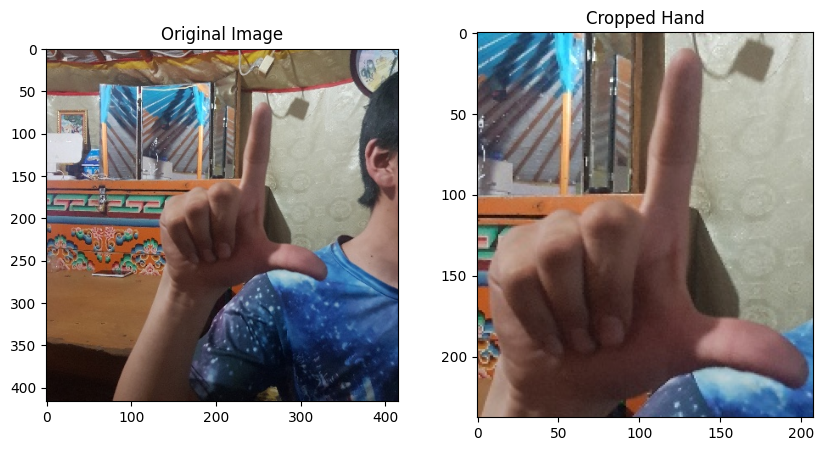

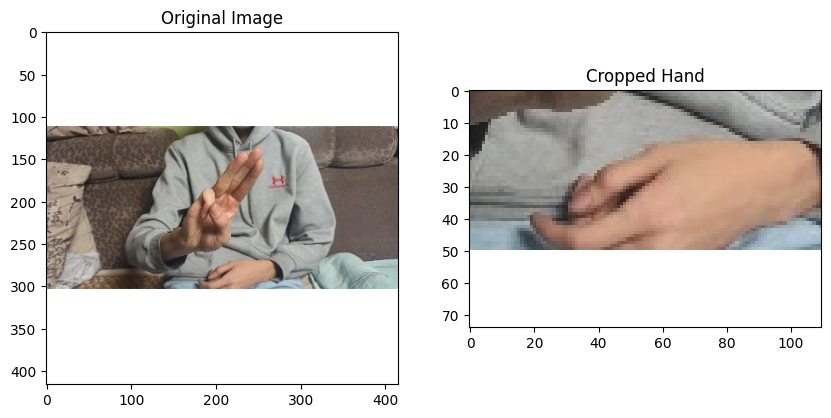

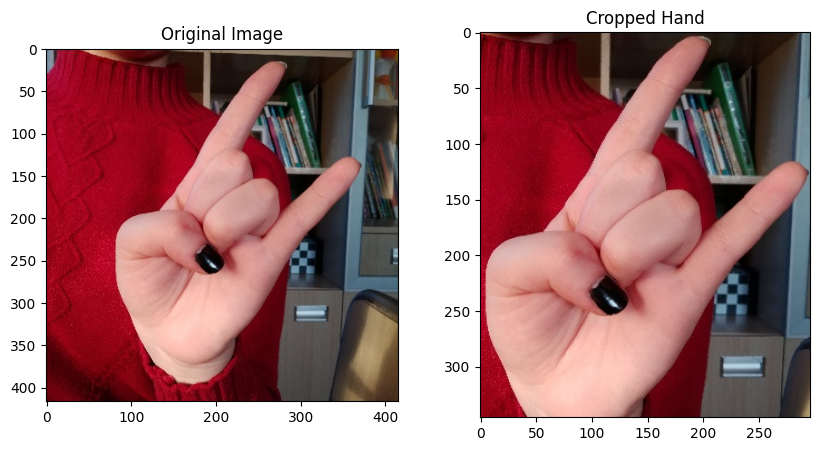

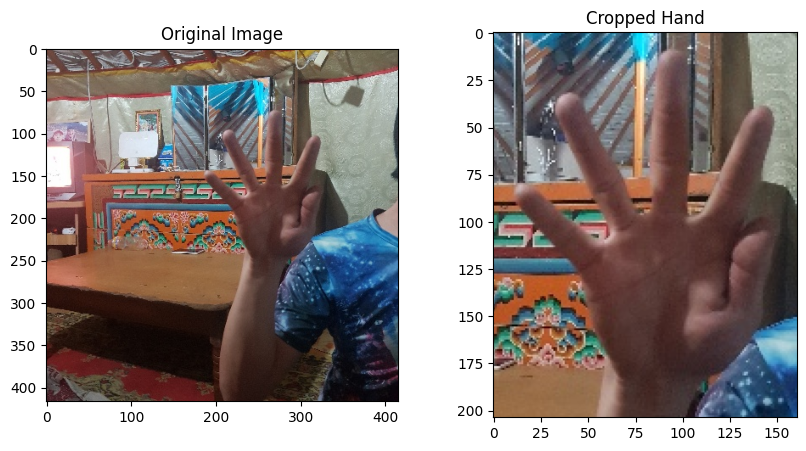

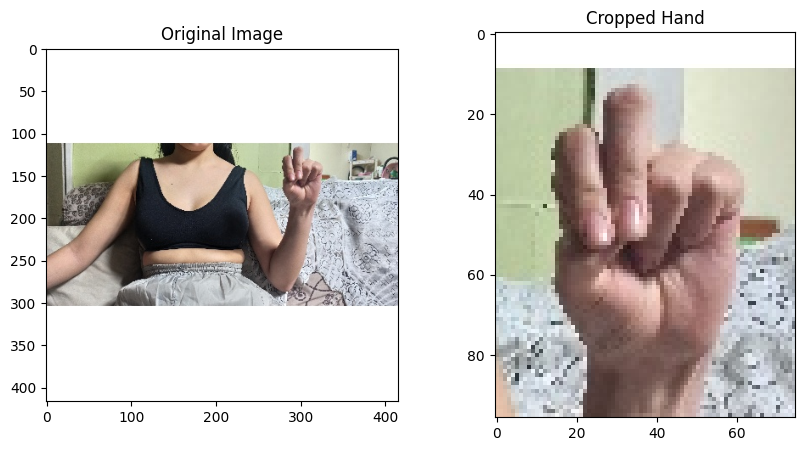

...

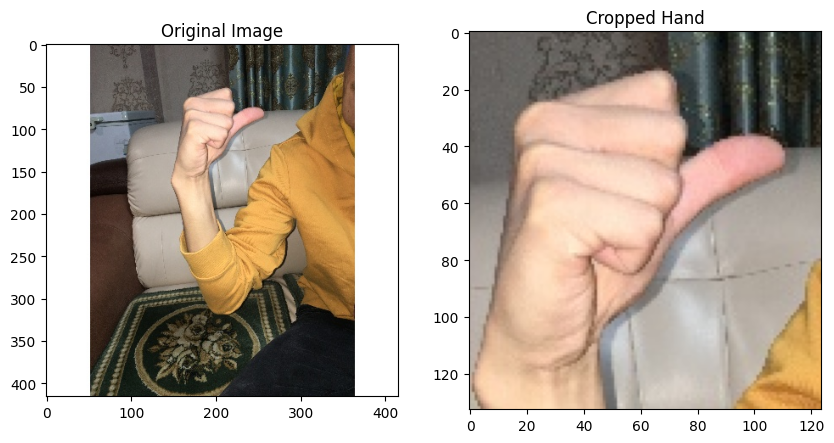

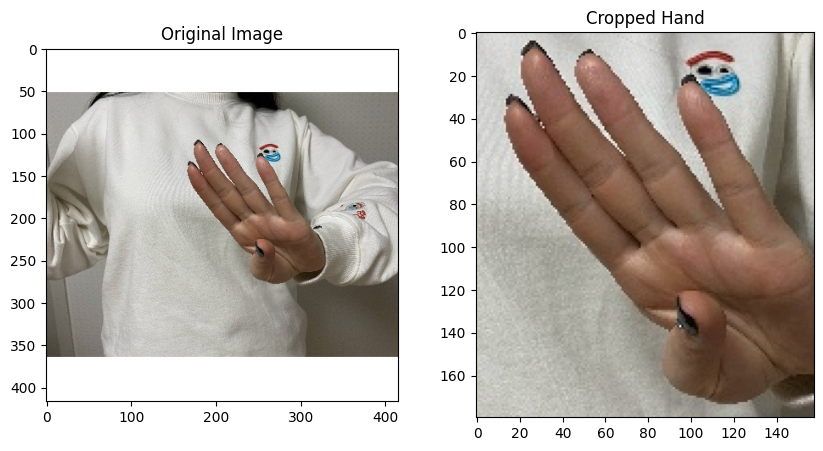

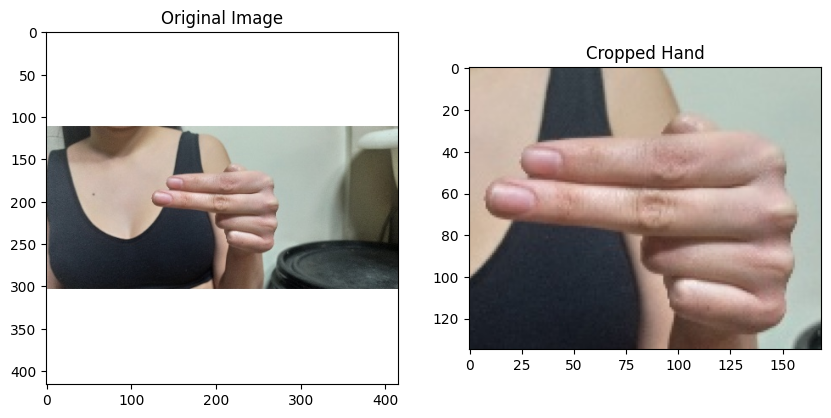

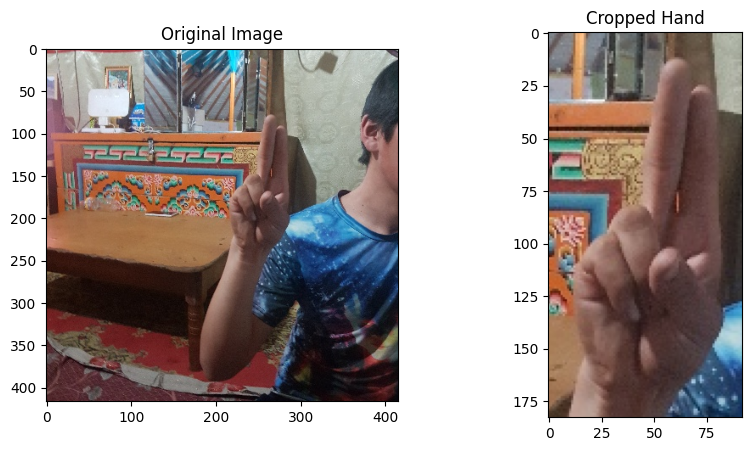

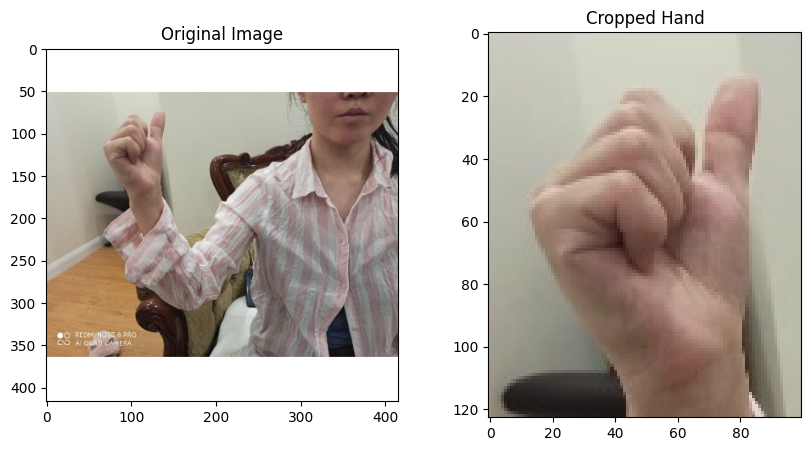

In [6]:
import matplotlib.pyplot as plt

# Select 20 samples from df_cropped where cropped_image is not None
sampled_df = df_cropped[df_cropped['cropped_image'].notnull()].sample(20, random_state=42)

# Plot original and cropped images side by side
for idx, row in sampled_df.iterrows():
    original_img = Image.open(row['image_path'])
    cropped_img = row['cropped_image']
    
    # Display the original and cropped images
    plt.figure(figsize=(10, 5))
    
    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    
    # Cropped image
    plt.subplot(1, 2, 2)
    plt.imshow(cropped_img)
    plt.title("Cropped Hand")
    
    plt.show()


In [30]:
from PIL import Image

for idx, img in enumerate(df_cropped['cropped_image']):
    if not isinstance(img, Image.Image):
        print(f"Invalid entry at index {idx}: {img}")



Invalid entry at index 65: None
Invalid entry at index 81: None
Invalid entry at index 88: None
Invalid entry at index 96: None
Invalid entry at index 117: None
Invalid entry at index 139: None
Invalid entry at index 143: None
Invalid entry at index 159: None
Invalid entry at index 166: None
Invalid entry at index 174: None
Invalid entry at index 186: None
Invalid entry at index 193: None
Invalid entry at index 207: None
Invalid entry at index 216: None
Invalid entry at index 217: None
Invalid entry at index 233: None
Invalid entry at index 238: None
Invalid entry at index 245: None
Invalid entry at index 250: None
Invalid entry at index 271: None
Invalid entry at index 317: None
Invalid entry at index 328: None
Invalid entry at index 345: None
Invalid entry at index 368: None
Invalid entry at index 373: None
Invalid entry at index 381: None
Invalid entry at index 413: None
Invalid entry at index 417: None
Invalid entry at index 424: None
Invalid entry at index 426: None
Invalid entry 

In [31]:
def prepare_image_data(df, img_size=(64, 64)):
    images = []
    labels = []
    
    for idx, row in df.iterrows():
        img = row['cropped_image']
        label = row['label']
        
        # Skip if image is None
        if img is None:
            continue
        
        # Resize image and convert to numpy array
        img_resized = img.resize(img_size)
        img_array = np.array(img_resized) / 255.0  # Normalize
        
        images.append(img_array)
        labels.append(label)
    
    return np.array(images), np.array(labels)


In [32]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
import numpy as np
from PIL import Image

# Function to prepare image data
def prepare_image_data(df, img_size=(64, 64)):
    images = []
    labels = []
    
    for idx, row in df.iterrows():
        img = row['cropped_image']
        label = row['label']
        
        # Skip if image is None
        if img is None:
            print(f"Skipping index {idx} due to missing image")
            continue
        
        # Resize image and normalize
        img_resized = img.resize(img_size)
        img_array = np.array(img_resized) / 255.0
        
        images.append(img_array)
        labels.append(label)
    
    return np.array(images), np.array(labels)

# Prepare data
X, y = prepare_image_data(df_cropped)

# Convert labels to categorical
label_classes = df_cropped['label'].unique()
label_to_index = {label: idx for idx, label in enumerate(label_classes)}
y = np.array([label_to_index[label] for label in y])
y = to_categorical(y, num_classes=len(label_classes))

# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Function to create the CNN model
def create_cnn_model(input_shape, num_classes):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define model parameters
input_shape = X_train.shape[1:]  # Shape of resized images
num_classes = len(label_classes)

# Create and compile CNN model
model = create_cnn_model(input_shape, num_classes)


Skipping index 65 due to missing image
Skipping index 81 due to missing image
Skipping index 88 due to missing image
Skipping index 96 due to missing image
Skipping index 117 due to missing image
Skipping index 139 due to missing image
Skipping index 143 due to missing image
Skipping index 159 due to missing image
Skipping index 166 due to missing image
Skipping index 174 due to missing image
Skipping index 186 due to missing image
Skipping index 193 due to missing image
Skipping index 207 due to missing image
Skipping index 216 due to missing image
Skipping index 217 due to missing image
Skipping index 233 due to missing image
Skipping index 238 due to missing image
Skipping index 245 due to missing image
Skipping index 250 due to missing image
Skipping index 271 due to missing image
Skipping index 317 due to missing image
Skipping index 328 due to missing image
Skipping index 345 due to missing image
Skipping index 368 due to missing image
Skipping index 373 due to missing image
Skip

c:\Users\BasantBadr\.conda\envs\python311-env\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [33]:
# Set up data augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1
)

# Train the model
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    validation_data=(X_val, y_val),
    epochs=20,
    verbose=1
)


Epoch 1/20


c:\Users\BasantBadr\.conda\envs\python311-env\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


333/333 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step - accuracy: 0.0600 - loss: 3.7263 - val_accuracy: 0.3953 - val_loss: 2.2760
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - accuracy: 0.3104 - loss: 2.4636 - val_accuracy: 0.6693 - val_loss: 1.2650
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - accuracy: 0.4810 - loss: 1.7832 - val_accuracy: 0.7703 - val_loss: 0.8411
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - accuracy: 0.5852 - loss: 1.4049 - val_accuracy: 0.7706 - val_loss: 0.8274
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - accuracy: 0.6577 - loss: 1.1420 - val_accuracy: 0.8427 - val_loss: 0.5493
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - accuracy: 0.6939 - loss: 0.9947 - val_accuracy: 0.8690 - val_loss: 0.4797
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.7391 - loss: 0.8620 - val_accuracy: 0.8765 - val_loss: 0.4260
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step - accuracy: 0.7466 - loss: 0.7963 - val_accurac

84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9257 - loss: 0.2233
Validation Accuracy: 92.68%
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


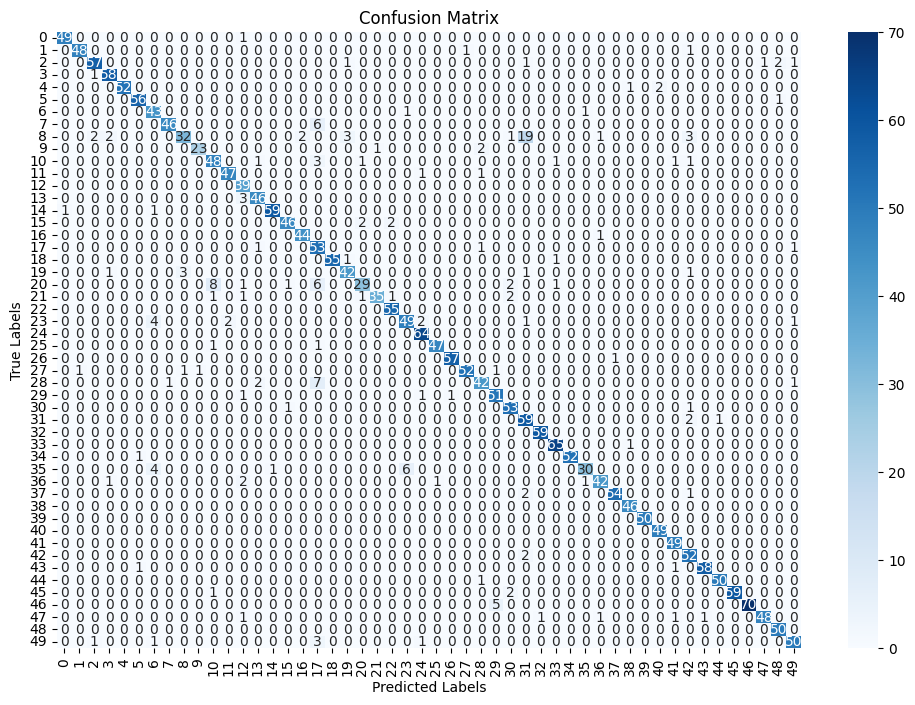


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        50
           1       0.98      0.96      0.97        50
           2       0.93      0.90      0.92        63
           3       0.94      0.98      0.96        59
           4       1.00      0.95      0.97        55
           5       0.97      0.98      0.97        57
           6       0.81      0.96      0.88        45
           7       0.98      0.88      0.93        52
           8       0.89      0.49      0.63        65
           9       0.96      0.88      0.92        26
          10       0.81      0.86      0.83        56
          11       0.96      0.96      0.96        49
          12       0.80      1.00      0.89        39
          13       0.92      0.94      0.93        49
          14       0.98      0.97      0.98        61
          15       0.96      0.92      0.94        50
          16       0.96      0.98      0.97        45
   

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Evaluate the model
val_loss, val_accuracy = model.evaluate(X_val, y_val, verbose=1)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

# Predict labels for validation data
y_pred = np.argmax(model.predict(X_val), axis=1)
y_true = np.argmax(y_val, axis=1)  # Assuming `y_val` is one-hot encoded

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix with a larger figure size
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=range(len(conf_matrix)), yticklabels=range(len(conf_matrix)))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Compute and display evaluation metrics
print("\nClassification Report:")
print(classification_report(y_true, y_pred))


In [35]:
import random
import matplotlib.pyplot as plt

# Function to preprocess a single image and make a prediction
def predict_and_visualize(model, image, label_classes, img_size=(64, 64)):
    # Resize and normalize the image
    img_resized = image.resize(img_size)
    img_array = np.array(img_resized) / 255.0  # Normalize
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

    # Make prediction
    predictions = model.predict(img_array)
    predicted_index = np.argmax(predictions)
    predicted_label = label_classes[predicted_index]
    confidence = np.max(predictions) * 100

    return predicted_label, confidence


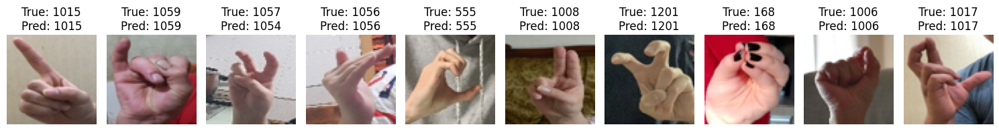

In [44]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_predictions(df, model, label_classes, num_samples=10, img_size=(64, 64)):

    # Randomly select samples
    df_sampled = df.sample(n=num_samples)
    
    plt.figure(figsize=(15, 5))
    
    for i, row in enumerate(df_sampled.itertuples()):
        # Retrieve the image and label
        img = row.cropped_image
        true_label = row.label
        
        if img is None:
            print(f"Skipping visualization for index {i} due to missing image.")
            continue
        
        # Preprocess the image
        img_resized = img.resize(img_size)
        img_array = np.array(img_resized) / 255.0  # Normalize
        
        # Add batch dimension and predict
        img_batch = np.expand_dims(img_array, axis=0)
        predictions = model.predict(img_batch, verbose=0)
        predicted_label_idx = np.argmax(predictions)
        predicted_label = label_classes[predicted_label_idx]
        
        # Plot the image
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img_resized)
        plt.axis('off')
        plt.title(f"True: {true_label}\nPred: {predicted_label}")
    
    plt.tight_layout()
    plt.show()

# Assuming `df_cropped` contains the cropped images and their true labels
visualize_predictions(df_cropped, model, label_classes, num_samples=10)

